# Data Mining Project

## Importing packages and data

In [244]:
#standard
import numpy as np
import pandas as pd

#math
import statsmodels.api as sm
import statsmodels.tsa.api as smt
import math
import scipy as sc
from scipy.spatial import distance

#sklearn normalization/scaling
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler

#sklearn encoders
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.experimental import enable_iterative_imputer 
from sklearn.impute import IterativeImputer
from sklearn.impute import KNNImputer

#sklearn clustering
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, MeanShift, DBSCAN, estimate_bandwidth,AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, davies_bouldin_score,silhouette_samples,pairwise_distances
from sklearn.manifold import TSNE

#sklearn prediction/trainings
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.base import clone

#visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import graphviz

#sompy
import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView

#reporting
import pandas_profiling

import warnings
warnings.filterwarnings("ignore")

%config InlineBackend.figure_format = 'retina'

In [2]:
path = r'Datasets/donors.csv'
df = pd.read_csv(path)

## Thought Process


Let's first think about what can lead to people to donate?
- Personal conexion to the cause(Older people; people that normally donate);
- Being a veteran/veteren relative;
- People that want to feel better with themselves as a true citizen
- Religion;
- In some country/states, there are some taxation benefits relative to the amount of donations given.
- Publicity of the cause;

How can people know aboout the cause?
- Email;
- Mail;
- Social Networks;
- Radio;
- Publicity via person to person;

After investigate the metadata with all descriptions of the variables in the dataset, it was decided to divided them at first by the following subset with features that can, in our understanding, translate, in a hypothetically way, all the remaining variables not chose.
This features were separated by the following:
- Demographic and Social Economic Status;
- Neighbourhood quantifiers of certain aspects of a sample with Census information;
- Donor Interests;
- Dates relative to donations and campaign promotions;
- RFA(this is a metric of segmentation/clustering, usually used in the business clustering department);
- Amount of Donations given;
- Summary of numerical features relative with Donors behaviour;

In [3]:
data= df[[
      #donor_demographic_and_social_economic_status
      "CONTROLN","STATE","DOB","MDMAUD", "DOMAIN", "HOMEOWNR","NUMCHLD","MAJOR","INCOME","GENDER","HIT",
      #neighbourhood
      'POP903','AC1','AC2','MALEMILI','MALEVET','FEDGOV','AFC1','AFC2','AFC3','AFC4','AFC5','AFC6','VC1','VC2','VC3','VC4',
      "ETHC2","ETHC3","ETHC5","ETHC6","IC5",'EC2','EC3','EC4','EC5','EC6','EC7','EC8','MARR1','MARR2','MARR3','MARR4',
      #donor interests
      "COLLECT1", "VETERANS", "BIBLE", "CATLG", "HOMEE", "PETS","CDPLAY", "STEREO", "PCOWNERS", 
      "PHOTO", "CRAFTS", "FISHER","GARDENIN", "BOATS", "WALKER", "KIDSTUFF", "CARDS", "PLATES",
      #date the gift was sent
      "ADATE_2", "ADATE_3","ADATE_4","ADATE_5","ADATE_6","ADATE_7","ADATE_8","ADATE_9","ADATE_10",
      "ADATE_11","ADATE_12","ADATE_13","ADATE_14","ADATE_15","ADATE_16","ADATE_17","ADATE_18","ADATE_19","ADATE_20",
      "ADATE_21","ADATE_22","ADATE_23","ADATE_24",
      #RFA
      'RFA_2','RFA_3','RFA_4','RFA_5','RFA_6','RFA_7','RFA_8','RFA_9','RFA_10',
      'RFA_11','RFA_12','RFA_13','RFA_14','RFA_15','RFA_16','RFA_17','RFA_18','RFA_19',
      'RFA_20','RFA_21','RFA_22','RFA_23','RFA_24',
      #date that gift was received
      "RDATE_3","RDATE_4","RDATE_5","RDATE_6","RDATE_7","RDATE_8","RDATE_9","RDATE_10",
      "RDATE_11","RDATE_12","RDATE_13","RDATE_14","RDATE_15","RDATE_16","RDATE_17","RDATE_18","RDATE_19","RDATE_20",
      "RDATE_21","RDATE_22","RDATE_23","RDATE_24",
      #dollar amount
      "RAMNT_3","RAMNT_4","RAMNT_5","RAMNT_6","RAMNT_7","RAMNT_8","RAMNT_9","RAMNT_10",
      "RAMNT_11","RAMNT_12","RAMNT_13","RAMNT_14","RAMNT_15","RAMNT_16","RAMNT_17","RAMNT_18","RAMNT_19","RAMNT_20",
      "RAMNT_21","RAMNT_22","RAMNT_23","RAMNT_24",
       #summary variables
      "PEPSTRFL", "MAXADATE", "NUMPROM", 'CARDPROM', "NUMPRM12","RAMNTALL",
      "NGIFTALL", "CARDGIFT", "MINRAMNT", "MAXRAMNT","LASTGIFT", "LASTDATE", "FISTDATE","NEXTDATE",
      "TIMELAG", "AVGGIFT","MDMAUD_R", "MDMAUD_F", "MDMAUD_A"]]

## First look at the data

In [4]:
data

,CONTROLN,STATE,DOB,MDMAUD,DOMAIN,HOMEOWNR,NUMCHLD,MAJOR,INCOME,GENDER,...,MAXRAMNT,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,MDMAUD_R,MDMAUD_F,MDMAUD_A
0,95515,IL,1957-12-01,XXXX,T2,,NaN,,NaN,F,...,12.0,10.0,2015-12-01,2009-11-01,2010-03-01,4.0,7.741935,X,X,X
1,148535,CA,1972-02-01,XXXX,S1,H,1.0,,6.0,M,...,25.0,25.0,2015-12-01,2013-10-01,2015-04-01,18.0,15.666667,X,X,X
2,15078,NC,NaN,XXXX,R2,U,NaN,,3.0,M,...,16.0,5.0,2015-12-01,2010-01-01,2011-01-01,12.0,7.481481,X,X,X
3,172556,CA,1948-01-01,XXXX,R2,U,NaN,,1.0,F,...,11.0,10.0,2015-12-01,2007-02-01,2007-11-01,9.0,6.812500,X,X,X
4,7112,FL,1940-01-01,XXXX,S2,H,1.0,,3.0,F,...,15.0,15.0,2016-01-01,1999-03-01,2000-05-01,14.0,6.864865,X,X,X
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95407,184568,AK,NaN,XXXX,C2,,NaN,,NaN,M,...,25.0,25.0,2016-02-01,2016-02-01,NaN,NaN,25.000000,X,X,X
95408,122706,TX,1970-01-01,XXXX,C1,H,1.0,,7.0,M,...,20.0,20.0,2016-03-01,2016-03-01,NaN,NaN,20.000000,X,X,X
95409,189641,MI,1958-01-01,XXXX,C3,,NaN,,NaN,M,...,10.0,10.0,2016-10-01,2014-10-01,2015-01-01,3.0,8.285714,X,X,X
95410,4693,CA,1960-05-01,XXXX,C1,H,NaN,,7.0,F,...,21.0,18.0,2017-01-01,2006-12-01,2007-04-01,4.0,12.146341,X,X,X


In [5]:
#setting index to number id
data.set_index('CONTROLN', inplace = True)

In [6]:
data

,STATE,DOB,MDMAUD,DOMAIN,HOMEOWNR,NUMCHLD,MAJOR,INCOME,GENDER,HIT,...,MAXRAMNT,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,MDMAUD_R,MDMAUD_F,MDMAUD_A
CONTROLN,,,,,,,,,,,,,,,,,,,,,
95515,IL,1957-12-01,XXXX,T2,,NaN,,NaN,F,0,...,12.0,10.0,2015-12-01,2009-11-01,2010-03-01,4.0,7.741935,X,X,X
148535,CA,1972-02-01,XXXX,S1,H,1.0,,6.0,M,16,...,25.0,25.0,2015-12-01,2013-10-01,2015-04-01,18.0,15.666667,X,X,X
15078,NC,NaN,XXXX,R2,U,NaN,,3.0,M,2,...,16.0,5.0,2015-12-01,2010-01-01,2011-01-01,12.0,7.481481,X,X,X
172556,CA,1948-01-01,XXXX,R2,U,NaN,,1.0,F,2,...,11.0,10.0,2015-12-01,2007-02-01,2007-11-01,9.0,6.812500,X,X,X
7112,FL,1940-01-01,XXXX,S2,H,1.0,,3.0,F,60,...,15.0,15.0,2016-01-01,1999-03-01,2000-05-01,14.0,6.864865,X,X,X
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,AK,NaN,XXXX,C2,,NaN,,NaN,M,0,...,25.0,25.0,2016-02-01,2016-02-01,NaN,NaN,25.000000,X,X,X
122706,TX,1970-01-01,XXXX,C1,H,1.0,,7.0,M,1,...,20.0,20.0,2016-03-01,2016-03-01,NaN,NaN,20.000000,X,X,X
189641,MI,1958-01-01,XXXX,C3,,NaN,,NaN,M,0,...,10.0,10.0,2016-10-01,2014-10-01,2015-01-01,3.0,8.285714,X,X,X


In [7]:
#Checking duplicates values/number ID referring to the same person
any(data.duplicated())

False

# Preparing data

### Major vs Non-Major

In [8]:
#If it's  a major donor or a normal one

def encoding_mdmaud(x):
    x = str(x)
    if x.startswith("X"):
        return 0
    else:
        return 1
data['MDMAUD'] = data['MDMAUD'].apply(encoding_mdmaud).astype(int)

### Dates

In [9]:
data_adate = data[[col for col in data if col.startswith('ADATE')]]
data_rdate = data[[col for col in data if col.startswith('RDATE')]]

In [10]:
data[data_adate.columns].replace('nan', np.NaN, inplace=True)
data[data_rdate.columns].replace('nan', np.NaN, inplace=True)

In [11]:
data_adate.isna().sum()

ADATE_2         0
ADATE_3      1950
ADATE_4      2191
ADATE_5     33590
ADATE_6      3557
ADATE_7      8874
ADATE_8      3511
ADATE_9     11245
ADATE_10    32748
ADATE_11    10422
ADATE_12     8923
ADATE_13    40219
ADATE_14    18867
ADATE_15    65477
ADATE_16    20364
ADATE_17    27650
ADATE_18    21263
ADATE_19    24480
ADATE_20    50200
ADATE_21    35212
ADATE_22    25648
ADATE_23    56270
ADATE_24    36973
dtype: int64

In [12]:
data_rdate.isna().sum()

RDATE_3     95170
RDATE_4     95131
RDATE_5     95403
RDATE_6     94636
RDATE_7     86517
RDATE_8     73940
RDATE_9     78678
RDATE_10    84951
RDATE_11    80672
RDATE_12    69712
RDATE_13    83162
RDATE_14    72095
RDATE_15    88150
RDATE_16    68418
RDATE_17    86011
RDATE_18    75634
RDATE_19    79535
RDATE_20    87524
RDATE_21    85899
RDATE_22    74539
RDATE_23    87553
RDATE_24    77674
dtype: int64

After some observations of each column, it was possible to conclude that this missing values were not as relevant since it was all relative to promotions campaigns and their dates... so, it was decided to fill the missing values with the mode of each campaign/promotion.

In [13]:
adate_columns = data_adate.columns.to_list()
for column in adate_columns:
    data[column].fillna(data[column].mode()[0], inplace=True)

In [14]:
rdate_columns = data_rdate.columns.to_list()
for column in rdate_columns:
    data[column].fillna(data[column].mode()[0], inplace=True)

In [15]:
print(data[adate_columns].isna().sum())
print('---------/----------')
print(data[rdate_columns].isna().sum())

ADATE_2     0
ADATE_3     0
ADATE_4     0
ADATE_5     0
ADATE_6     0
ADATE_7     0
ADATE_8     0
ADATE_9     0
ADATE_10    0
ADATE_11    0
ADATE_12    0
ADATE_13    0
ADATE_14    0
ADATE_15    0
ADATE_16    0
ADATE_17    0
ADATE_18    0
ADATE_19    0
ADATE_20    0
ADATE_21    0
ADATE_22    0
ADATE_23    0
ADATE_24    0
dtype: int64
---------/----------
RDATE_3     0
RDATE_4     0
RDATE_5     0
RDATE_6     0
RDATE_7     0
RDATE_8     0
RDATE_9     0
RDATE_10    0
RDATE_11    0
RDATE_12    0
RDATE_13    0
RDATE_14    0
RDATE_15    0
RDATE_16    0
RDATE_17    0
RDATE_18    0
RDATE_19    0
RDATE_20    0
RDATE_21    0
RDATE_22    0
RDATE_23    0
RDATE_24    0
dtype: int64


### DOMAIN STATUS

- We are going to divide this variable into 2 new feature that can translate a little bit better the social economic status and the impact of it in number of donations / amount donated.

In [16]:
#converting domain into to separates categories --> Social Economic Status and Urban Residency Grade
data['DOMAIN'] = data['DOMAIN'].astype(str)
data['DOMAIN_SES'] = data['DOMAIN'].str.replace('([A-Z]+)', '')
data['DOMAIN_Urban'] = data['DOMAIN'].str.extract('([A-Z]+)')
del data['DOMAIN']

In [17]:
#filling null values with mode
# Same thought from previously convertion, so we have the same criteria 
# Lower better conditions so we have have a significative euclidean distance between urban and rural
print(data['DOMAIN_Urban'].mode()) # which is S --> nan = S
print(data['DOMAIN_Urban'].unique())
def encoding_urban(x):
    if str(x) == 'U':
        return 5 
    elif str(x) == 'C':
        return 4
    elif str(x) == 'S':
        return 3
    elif str(x) == 'T':
        return 2
    elif str(x) == 'R':
        return 1
    else:
        return 3
data['DOMAIN_Urban'] = data['DOMAIN_Urban'].apply(encoding_urban).astype(int)

0    S
dtype: object
['T' 'S' 'R' 'U' 'C' nan]


In [18]:
#missing values
#filling null values with mode
# Same thought from previously convertion, so we have the same criteria 
# Lower better conditions so we have have a significative euclidean distance between higher SSE and lower SSE
print(data['DOMAIN_SES'].unique())
#mode for missing values
print(data['DOMAIN_SES'].mode()) #--> although its numeric, its from a split of a str column

def missing(x):
    if str(x) == ' ':
        return '2'
    else:
        return x

data['DOMAIN_SES'] = data['DOMAIN_SES'].apply(missing).astype(int)

['2' '1' '3' ' ' '4']
0    2
dtype: object


In [19]:
data['DOMAIN_SES'].unique()

array([2, 1, 3, 4])

In [20]:
def encoding_ses(x):
    if str(x) == '4':
        return  1
    elif str(x) == '3':
        return 2
    elif str(x) == '2':
        return 3
    elif str(x) == '1':
        return 4
    else:
        return 2
data['DOMAIN_SES'] = data['DOMAIN_SES'].apply(encoding_ses).astype(int)

In [21]:
data['DOMAIN_SES'].unique()

array([3, 4, 2, 1])

### Gender

In [22]:
#converting gender
def convert_binary_gender(x):
    if str(x) == 'M':
        return 1
    elif str(x) == 'F':
        return 0
    else:
        return 2
data["GENDER"] = data["GENDER"].apply(convert_binary_gender).astype(int)

### Census/Demographic

In [23]:
#working with all percentages values in columns from census 

data_male_military = [col for col in data if col.startswith('MALEMILI')]
data_male_veteran = [col for col in data if col.startswith('MALEVET')]
data_fed_gov = [col for col in data if col.startswith('FEDGOV')]

data_eth = [col for col in data if col.startswith('ETHC')]
data_afc = [col for col in data if col.startswith('AFC')]
data_vc = [col for col in data if col.startswith('VC')]
data_ec = [col for col in data if col.startswith('EC')]
data_marr = [col for col in data if col.startswith('MARR')]
data_ac = [col for col in data if col.startswith('AC')]


data[data_eth] = data[data_eth] / 100
data[data_afc] = data[data_afc] / 100
data[data_vc] = data[data_vc] / 100
data[data_male_military] = data[data_male_military] / 100
data[data_male_veteran] = data[data_male_veteran] / 100
data[data_fed_gov] = data[data_fed_gov] / 100
data[data_ec] = data[data_ec] / 100
data[data_marr] = data[data_marr] / 100
data[data_ac] = data[data_ac] / 100


### Binary Variables/Interests

In [24]:
# Same thought from previously convertion, so we have the same criteria 
# Lower better conditions so we have have a significative euclidean distance between home owner or not --> 
# Higher Probability for a possible Higher Income/SSE if the person owns a home
data['HOMEOWNR'] = data['HOMEOWNR'].astype(str)
data['HOMEOWNR'] = data['HOMEOWNR'].apply(lambda x: 1 if x == 'H' else 0).astype(int)

In [25]:
#DONOR INTERESTS
#"COLLECT1", "VETERANS", "BIBLE", "CATLG", "HOMEE", "PETS",
#   "CDPLAY", "STEREO", "PCOWNERS", "PHOTO", "CRAFTS", "FISHER",
#   "GARDENIN", "BOATS", "WALKER", "KIDSTUFF", "CARDS", "PLATES"

def convert_binary(x):
    if str(x) == 'Y':
        return 1
    elif str(x) == ' ':
        return 0
    else:
        return np.nan
    
data['COLLECT1'] = data['COLLECT1'].apply(convert_binary).astype(int)
data["VETERANS"] = data["VETERANS"].apply(convert_binary).astype(int)
data["BIBLE"] = data["BIBLE"].apply(convert_binary).astype(int)
data["CATLG"] = data["CATLG"].apply(convert_binary).astype(int)
data["HOMEE"] = data["HOMEE"].apply(convert_binary).astype(int)
data["PETS"] = data["PETS"].apply(convert_binary).astype(int)
data["CDPLAY"] = data["CDPLAY"].apply(convert_binary).astype(int)
data["STEREO"] = data["STEREO"].apply(convert_binary).astype(int)
data["PCOWNERS"] = data["PCOWNERS"].apply(convert_binary).astype(int)
data["PHOTO"] = data["PHOTO"].apply(convert_binary).astype(int)
data["CRAFTS"] = data["CRAFTS"].apply(convert_binary).astype(int)
data["FISHER"] = data["FISHER"].apply(convert_binary).astype(int)
data["GARDENIN"] = data["GARDENIN"].apply(convert_binary).astype(int)
data["BOATS"] = data["BOATS"].apply(convert_binary).astype(int)
data["WALKER"] = data["WALKER"].apply(convert_binary).astype(int)
data["KIDSTUFF"] = data["KIDSTUFF"].apply(convert_binary).astype(int)
data["CARDS"] = data["CARDS"].apply(convert_binary).astype(int)
data["PLATES"] = data["PLATES"].apply(convert_binary).astype(int)

In [26]:
interests_data= data[['COLLECT1',"VETERANS","BIBLE","CATLG",
     "HOMEE","PETS","CDPLAY","STEREO","PCOWNERS",
     "PHOTO","CRAFTS","FISHER","GARDENIN","BOATS",
     "WALKER","KIDSTUFF","CARDS","PLATES"]]

In [27]:
interests_data.isna().sum()

COLLECT1    0
VETERANS    0
BIBLE       0
CATLG       0
HOMEE       0
PETS        0
CDPLAY      0
STEREO      0
PCOWNERS    0
PHOTO       0
CRAFTS      0
FISHER      0
GARDENIN    0
BOATS       0
WALKER      0
KIDSTUFF    0
CARDS       0
PLATES      0
dtype: int64

In [28]:
#PEPSTRFL --> Indicates PEP Star RFA Status
#Question(?) --> what means pep star and it's relative with how many donors a person gives ?
data['PEPSTRFL'] = data['PEPSTRFL'].astype(str)
def convert_binary_star(x):
    if str(x) == 'X':
        return 1
    else:
        return 0

data['PEPSTRFL'] = data['PEPSTRFL'].apply(convert_binary_star).astype(int)

### Age

 - Although there are dates beyond the last promotion sent, it was decided to use this date as a reference since the classification of lapsed donors from RFA_2R is based on this criteria/date;

In [29]:
data['DOB'] = pd.to_datetime(data['DOB'] ,errors = 'coerce',format = '%Y-%m-%d')
data['today'] = pd.to_datetime('2017-06-01')
data['today'] = pd.to_datetime(data['today'] ,errors = 'coerce',format = '%Y-%m-%d')

data['Age'] = data['today'].dt.to_period('Y').astype(int) - data['DOB'].dt.to_period('Y').astype(int)

In [30]:
data['Age'] = data['Age'].apply(lambda x: np.nan if x < 0 else x)

In [31]:
data.drop(['DOB'],axis = 1,inplace = True)

In [32]:
#Define metric and non-metric datasets
metric_data = data[['NUMCHLD','Age','INCOME','DOMAIN_Urban','DOMAIN_SES','RAMNTALL','NUMPROM','AVGGIFT',
                    'POP903','AC1','AC2','MALEMILI','MALEVET','FEDGOV','AFC1','AFC2','AFC3','AFC4','AFC5','AFC6','VC1','VC2','VC3','VC4',
                    "ETHC2","ETHC3","ETHC5","ETHC6","IC5",'EC2','EC3','EC4','EC5','EC6','EC7','EC8','MARR1','MARR2','MARR3','MARR4']]
metric_features = metric_data.columns.to_list()

In [33]:
metric_data

,NUMCHLD,Age,INCOME,DOMAIN_Urban,DOMAIN_SES,RAMNTALL,NUMPROM,AVGGIFT,POP903,AC1,...,EC3,EC4,EC5,EC6,EC7,EC8,MARR1,MARR2,MARR3,MARR4
CONTROLN,,,,,,,,,,,,,,,,,,,,,
95515,NaN,60.0,NaN,2,3,240.0,74,7.741935,332,0.10,...,0.10,0.39,0.21,0.08,0.04,0.03,0.61,0.07,0.12,0.19
148535,1.0,45.0,6.0,3,4,47.0,32,15.666667,998,0.06,...,0.05,0.12,0.21,0.07,0.30,0.20,0.69,0.04,0.03,0.24
15078,NaN,NaN,3.0,1,3,202.0,63,7.481481,2669,0.06,...,0.20,0.28,0.16,0.06,0.05,0.03,0.63,0.09,0.09,0.19
172556,NaN,69.0,1.0,1,3,109.0,66,6.812500,219,0.06,...,0.12,0.14,0.27,0.10,0.03,0.05,0.63,0.09,0.06,0.23
7112,1.0,77.0,3.0,3,3,254.0,113,6.864865,761,0.07,...,0.20,0.30,0.13,0.03,0.12,0.05,0.42,0.17,0.09,0.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,NaN,NaN,NaN,4,3,25.0,14,25.000000,10037,0.04,...,0.07,0.28,0.33,0.08,0.15,0.08,0.58,0.15,0.03,0.24
122706,1.0,47.0,7.0,4,4,20.0,10,20.000000,361,0.03,...,0.06,0.12,0.24,0.07,0.36,0.14,0.73,0.04,0.02,0.20
189641,NaN,59.0,NaN,4,2,58.0,33,8.285714,205,0.03,...,0.03,0.51,0.23,0.07,0.11,0.00,0.45,0.19,0.05,0.31


In [34]:
nans_index = data[metric_features].isna().any(axis=1)
data[metric_features][nans_index]

,NUMCHLD,Age,INCOME,DOMAIN_Urban,DOMAIN_SES,RAMNTALL,NUMPROM,AVGGIFT,POP903,AC1,...,EC3,EC4,EC5,EC6,EC7,EC8,MARR1,MARR2,MARR3,MARR4
CONTROLN,,,,,,,,,,,,,,,,,,,,,
95515,NaN,60.0,NaN,2,3,240.0,74,7.741935,332,0.10,...,0.10,0.39,0.21,0.08,0.04,0.03,0.61,0.07,0.12,0.19
15078,NaN,NaN,3.0,1,3,202.0,63,7.481481,2669,0.06,...,0.20,0.28,0.16,0.06,0.05,0.03,0.63,0.09,0.09,0.19
172556,NaN,69.0,1.0,1,3,109.0,66,6.812500,219,0.06,...,0.12,0.14,0.27,0.10,0.03,0.05,0.63,0.09,0.06,0.23
47784,NaN,NaN,NaN,2,3,51.0,35,12.750000,6618,0.06,...,0.14,0.27,0.19,0.07,0.15,0.08,0.65,0.09,0.05,0.21
109359,NaN,NaN,2.0,2,3,31.0,35,6.200000,512,0.09,...,0.03,0.49,0.20,0.03,0.17,0.05,0.69,0.09,0.03,0.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35088,NaN,49.0,6.0,3,3,81.0,59,3.375000,628,0.05,...,0.25,0.27,0.19,0.09,0.08,0.02,0.66,0.10,0.06,0.18
184568,NaN,NaN,NaN,4,3,25.0,14,25.000000,10037,0.04,...,0.07,0.28,0.33,0.08,0.15,0.08,0.58,0.15,0.03,0.24
189641,NaN,59.0,NaN,4,2,58.0,33,8.285714,205,0.03,...,0.03,0.51,0.23,0.07,0.11,0.00,0.45,0.19,0.05,0.31


In [35]:
# KNNImputer - only works for numerical 
imputer = KNNImputer(n_neighbors=5, weights="uniform")
data[metric_features] = imputer.fit_transform(data[metric_features])

In [36]:
# See rows with NaNs imputed
# See rows with NaNs imputed
# See rows with NaNs imputed
data.loc[nans_index, metric_features]

,NUMCHLD,Age,INCOME,DOMAIN_Urban,DOMAIN_SES,RAMNTALL,NUMPROM,AVGGIFT,POP903,AC1,...,EC3,EC4,EC5,EC6,EC7,EC8,MARR1,MARR2,MARR3,MARR4
CONTROLN,,,,,,,,,,,,,,,,,,,,,
95515,2.0,60.0,3.4,2.0,3.0,240.0,74.0,7.741935,332.0,0.10,...,0.10,0.39,0.21,0.08,0.04,0.03,0.61,0.07,0.12,0.19
15078,1.0,56.4,3.0,1.0,3.0,202.0,63.0,7.481481,2669.0,0.06,...,0.20,0.28,0.16,0.06,0.05,0.03,0.63,0.09,0.09,0.19
172556,2.0,69.0,1.0,1.0,3.0,109.0,66.0,6.812500,219.0,0.06,...,0.12,0.14,0.27,0.10,0.03,0.05,0.63,0.09,0.06,0.23
47784,1.6,51.0,4.2,2.0,3.0,51.0,35.0,12.750000,6618.0,0.06,...,0.14,0.27,0.19,0.07,0.15,0.08,0.65,0.09,0.05,0.21
109359,1.8,65.2,2.0,2.0,3.0,31.0,35.0,6.200000,512.0,0.09,...,0.03,0.49,0.20,0.03,0.17,0.05,0.69,0.09,0.03,0.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35088,1.6,49.0,6.0,3.0,3.0,81.0,59.0,3.375000,628.0,0.05,...,0.25,0.27,0.19,0.09,0.08,0.02,0.66,0.10,0.06,0.18
184568,2.0,59.8,3.0,4.0,3.0,25.0,14.0,25.000000,10037.0,0.04,...,0.07,0.28,0.33,0.08,0.15,0.08,0.58,0.15,0.03,0.24
189641,2.4,59.0,3.6,4.0,2.0,58.0,33.0,8.285714,205.0,0.03,...,0.03,0.51,0.23,0.07,0.11,0.00,0.45,0.19,0.05,0.31


In [37]:
data.Age.mean()

58.54695006917368

In [38]:
def converter_float(x):
    if x < 1.5:
        return 1
    elif 1.5 >=x < 2.5:
        return 2
    elif 2.5 >= x < 3.5:
        return 3
    elif 3.5 >= x < 4.5:
        return 4
    elif 4.5 >= x < 5.5:
        return 5
    elif 5.5 >= x < 6.5:
        return 6
    elif 6.5 >= x < 7.5:
        return 7
    else:
        return 8
    
data['INCOME'] = data['INCOME'].apply(converter_float)
data['NUMCHLD'] = data['NUMCHLD'].apply(converter_float)

In [39]:
def converter_age(x):
    return int(x)

data['Age'] = data['Age'].apply(converter_age)

In [40]:
data

,STATE,MDMAUD,HOMEOWNR,NUMCHLD,MAJOR,INCOME,GENDER,HIT,POP903,AC1,...,NEXTDATE,TIMELAG,AVGGIFT,MDMAUD_R,MDMAUD_F,MDMAUD_A,DOMAIN_SES,DOMAIN_Urban,today,Age
CONTROLN,,,,,,,,,,,,,,,,,,,,,
95515,IL,0,0,3,,4,0,0,332.0,0.10,...,2010-03-01,4.0,7.741935,X,X,X,3.0,2.0,2017-06-01,60
148535,CA,0,1,1,,7,1,16,998.0,0.06,...,2015-04-01,18.0,15.666667,X,X,X,4.0,3.0,2017-06-01,45
15078,NC,0,0,1,,4,1,2,2669.0,0.06,...,2011-01-01,12.0,7.481481,X,X,X,3.0,1.0,2017-06-01,56
172556,CA,0,0,3,,1,0,2,219.0,0.06,...,2007-11-01,9.0,6.812500,X,X,X,3.0,1.0,2017-06-01,69
7112,FL,0,1,1,,4,0,60,761.0,0.07,...,2000-05-01,14.0,6.864865,X,X,X,3.0,3.0,2017-06-01,77
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,AK,0,0,3,,4,1,0,10037.0,0.04,...,NaN,NaN,25.000000,X,X,X,3.0,4.0,2017-06-01,59
122706,TX,0,1,1,,8,1,1,361.0,0.03,...,NaN,NaN,20.000000,X,X,X,4.0,4.0,2017-06-01,47
189641,MI,0,0,3,,5,1,0,205.0,0.03,...,2015-01-01,3.0,8.285714,X,X,X,2.0,4.0,2017-06-01,59


#### How long are  donors not donating by months?

In [42]:
data['LASTDATE'] = pd.to_datetime(data['LASTDATE'] ,errors = 'coerce',format = '%Y-%m-%d')
data['Months'] = data['today'].dt.to_period('M').astype(int) - data['LASTDATE'].dt.to_period('M').astype(int)
data['Months'].astype(int)

CONTROLN
95515     18
148535    18
15078     18
172556    18
7112      17
          ..
184568    16
122706    15
189641     8
4693       5
185114     6
Name: Months, Length: 95412, dtype: int32

In [47]:
def heatmap(x,y):
    # Compute the correlation matrix for metric_features 
    corr = x.corr(method = y)

    # Generate a mask for the upper triangle
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(25, 12))

    # Generate a custom diverging colormap
    cmap = sns.color_palette("coolwarm", as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
                square=True, linewidths=.4, cbar_kws={"shrink": .5})

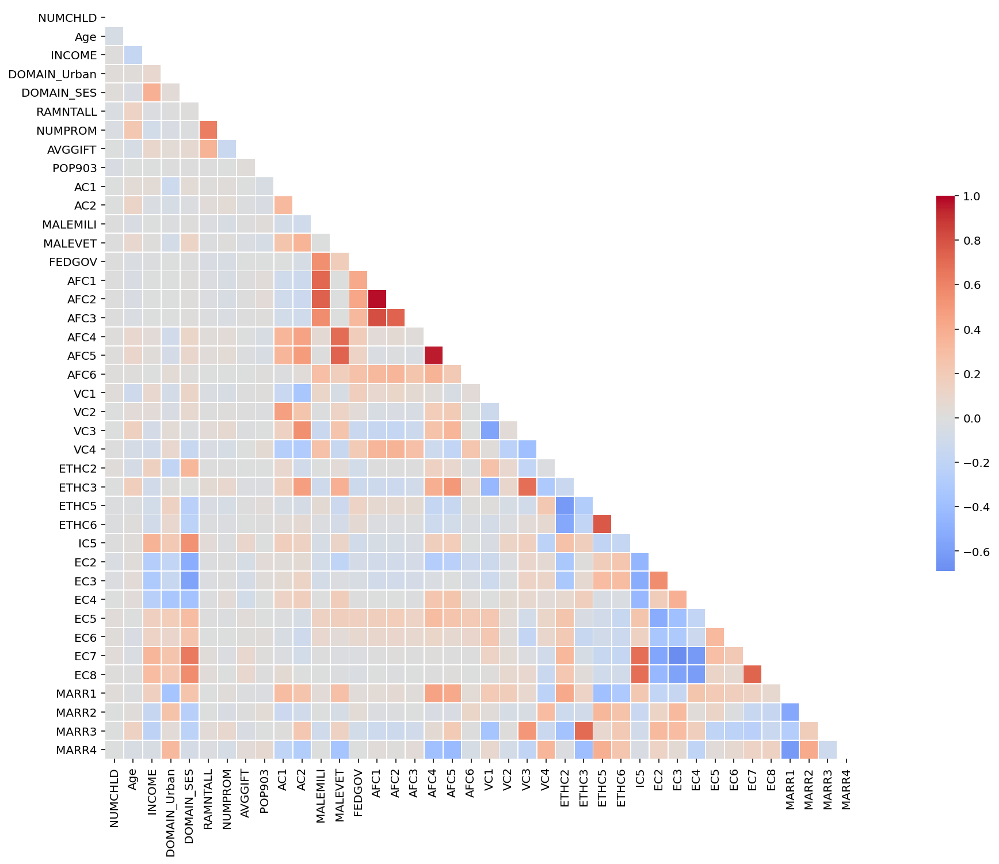

In [48]:
heatmap(data[metric_features],'pearson')

### Data Visualization 

Sometimes, it's easier to have a quick understanding of the data by visualizing it. It was decided to explore what it was talked about previously in Process Thought Section by plotting some variables/features to have some first insights of the donors behaviour.

#### Amount of Donation in $ for State

In [ ]:
state_ramntall = data[['STATE','RAMNTALL']].groupby(by = ['STATE']).sum().sort_values(by = ['RAMNTALL'], ascending = False).reset_index()
#state_ramntall

In [ ]:
fig = go.Figure(data=go.Choropleth(
    locations=state_ramntall['STATE'], # Spatial coordinates
    z = state_ramntall['RAMNTALL'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'greens',
    colorbar_title = "Amount of Donations in $",
))

fig.update_layout(
    title_text = 'PVA donations amount in $ by US County',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

#### Age importance for donations

In [ ]:
bins = [18, 30, 40, 50, 60, 70, 80,120]
labels = ['0-29', '30-39', '40-49', '50-59', '60-69', '70-79', '80+']
data['AgeRange'] = pd.cut(data.Age, bins, labels = labels,include_lowest = True)

In [ ]:
sns.set(rc={'figure.figsize': (24,12)})
ax = sns.boxplot(y='NGIFTALL', x='AgeRange', data=data, width = 0.5)

ax.set_xlabel("Age Range",fontsize=20)
ax.set_ylabel("Number of all gifts donated",fontsize=20)
ax.tick_params(labelsize=15)


plt.show()

#### Gender Distribution

In [ ]:
#0 --> Female / 1--> Male / 2 --> Joint Account(not specified)
labels = [0,1,2]
sizes = [data.query('GENDER == 0').GENDER.count(),data.query('GENDER == 1').GENDER.count(),data.query('GENDER == 2').GENDER.count()]
#colors
colors = ['pink','blue','green']
#explsion
explode = (0.05,0.05)
plt.figure(figsize=(4,4)) 
my_circle=plt.Circle( (0,0), 0.7, color='white')
plt.pie(sizes, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85)
p=plt.gcf()
plt.axis('equal')
p.gca().add_artist(my_circle)
plt.show()

#### Veterans Contributions

In [ ]:
sns.set(rc={'figure.figsize': (24,12)})

ax_reg1 = sns.lmplot(x='NUMPROM', y='RAMNTALL', hue="VETERANS",data=data)

plt.legend()
plt.xlabel("Total amount promotions received ")
plt.ylabel("Total amount of gifts donated in $")
plt.title('Veteran behaviour by number of promotions received')
plt.show()


#### Veteran / Non Veteran 

In [ ]:
sns.set(rc={'figure.figsize': (24,12)})

ax_reg2 = sns.relplot(x='NUMPROM', y='RAMNTALL', hue="VETERANS",data=data)

plt.legend()
plt.xlabel("Total amount promotions received ")
plt.ylabel("Total amount of gifts donated in $")
plt.title('Veteran/Non Veteran Donor behaviour by number of promotions received')
plt.show()


#### Religious Contributions

In [ ]:
# Being Veteran and Religious --> not too much
sns.set()
categorical_features_counts = data\
    .groupby(['BIBLE', 'VETERANS'])\
    .size()\
    .unstack()\
    .plot.bar(stacked=True)

### Feature Engineering/Dimensionality reduction

After watching the heatmap above relative to the correlation between the selected features, since some variables got really high values of correlation, it was decided to try a dimensionality reduction technique called Principal Component Analysis(PCA),where features that are highly correlated will be grouped in new features(components) that are not linearly correlated with each other and where the variance will be larger from the first to the last.
- Domain_Urban/SES/Income/EC(2-8)/MARR(1-4)
- AFC/VC/FEDGOV/MALEVET

Since using IQR method for identify/remove outliers, gives a prediction of 72% of "useful/clean" data(without any outlier), it was decided that, it would make more sense to use Robust Scaler to mitigate the information loss that could have happen if IQR method was used.

In [ ]:
'DOMAIN_Urban','DOMAIN_SES','INCOME','EC2','EC3','EC4','EC5','EC6','EC7','EC8','MARR1','MARR2','MARR3','MARR4'

#### Data normalization

In [50]:
# Use MinMaxScaler to scale the data
robust_scaler = RobustScaler()
robust_scaled_feat = robust_scaler.fit_transform(data[metric_features])
robust_scaled_feat

array([[ 1.        ,  0.04545455, -0.33333333, ..., -0.6       ,
         1.2       , -0.25      ],
       [ 0.        , -0.63636364,  0.66666667, ..., -1.2       ,
        -0.6       ,  0.375     ],
       [ 0.        , -0.13636364, -0.33333333, ..., -0.2       ,
         0.6       , -0.25      ],
       ...,
       [ 1.        ,  0.        ,  0.        , ...,  1.8       ,
        -0.2       ,  1.25      ],
       [ 0.        , -0.09090909,  1.        , ..., -0.2       ,
         0.4       ,  0.75      ],
       [ 0.        ,  0.90909091,  0.33333333, ..., -0.8       ,
        -0.6       , -0.375     ]])

In [55]:
data[metric_features] = robust_scaled_feat
data[metric_features]

,NUMCHLD,Age,INCOME,DOMAIN_Urban,DOMAIN_SES,RAMNTALL,NUMPROM,AVGGIFT,POP903,AC1,...,EC3,EC4,EC5,EC6,EC7,EC8,MARR1,MARR2,MARR3,MARR4
CONTROLN,,,,,,,,,,,,,,,,,,,,,
95515,1.0,0.045455,-0.333333,-0.5,0.0,1.780220,0.729730,-0.549026,-0.321066,1.333333,...,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.000000,-0.6,1.2,-0.250
148535,0.0,-0.636364,0.666667,0.0,1.0,-0.340659,-0.405405,0.568181,0.524112,0.000000,...,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,0.533333,-1.2,-0.6,0.375
15078,0.0,-0.136364,-0.333333,-1.0,0.0,1.362637,0.432432,-0.585744,2.644670,0.000000,...,0.727273,-0.071429,-0.555556,0.0,-0.538462,-0.285714,0.133333,-0.2,0.6,-0.250
172556,1.0,0.454545,-1.333333,-1.0,0.0,0.340659,0.513514,-0.680055,-0.464467,0.000000,...,0.000000,-1.071429,0.666667,0.8,-0.692308,0.000000,0.133333,-0.2,0.0,0.250
7112,0.0,0.818182,-0.333333,0.0,0.0,1.934066,1.783784,-0.672673,0.223350,0.333333,...,0.727273,0.071429,-0.888889,-0.6,0.000000,0.000000,-1.266667,1.4,0.6,1.500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,1.0,0.000000,-0.333333,0.5,0.0,-0.582418,-0.891892,1.883970,11.994924,-0.666667,...,-0.454545,-0.071429,1.333333,0.4,0.230769,0.428571,-0.200000,1.0,-0.6,0.375
122706,0.0,-0.545455,1.000000,0.5,1.0,-0.637363,-1.000000,1.179083,-0.284264,-1.000000,...,-0.545455,-1.214286,0.333333,0.2,1.846154,1.285714,0.800000,-1.2,-0.8,-0.125
189641,1.0,0.000000,0.000000,0.5,-1.0,-0.219780,-0.378378,-0.472366,-0.482234,-1.000000,...,-0.818182,1.571429,0.222222,0.2,-0.076923,-0.714286,-1.066667,1.8,-0.2,1.250


In [189]:
df1_pca = data[['DOMAIN_Urban','DOMAIN_SES','INCOME','IC5','EC2','EC3','EC4','EC5','EC6','EC7','MARR1','MARR2','MARR3','MARR4']]
df2_pca = data[['AC1','AC2','MALEMILI','MALEVET','FEDGOV','AFC1','AFC2','AFC3','AFC4','AFC5','AFC6','VC1','VC2','VC3','VC4']]


In [190]:
df1_pca_features = df1_pca.columns.to_list()
df2_pca_features = df2_pca.columns.to_list()

In [191]:
df1_pca

,DOMAIN_Urban,DOMAIN_SES,INCOME,IC5,EC2,EC3,EC4,EC5,EC6,EC7,MARR1,MARR2,MARR3,MARR4
CONTROLN,,,,,,,,,,,,,,
95515,-0.5,0.0,-0.333333,-0.114415,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,0.000000,-0.6,1.2,-0.250
148535,0.0,1.0,0.666667,3.041255,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,0.533333,-1.2,-0.6,0.375
15078,-1.0,0.0,-0.333333,-0.291492,1.777778,0.727273,-0.071429,-0.555556,0.0,-0.538462,0.133333,-0.2,0.6,-0.250
172556,-1.0,0.0,-1.333333,0.190015,2.444444,0.000000,-1.071429,0.666667,0.8,-0.692308,0.133333,-0.2,0.0,0.250
7112,0.0,0.0,-0.333333,-0.527232,1.111111,0.727273,0.071429,-0.888889,-0.6,0.000000,-1.266667,1.4,0.6,1.500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0.5,0.0,-0.333333,0.688186,-0.444444,-0.454545,-0.071429,1.333333,0.4,0.230769,-0.200000,1.0,-0.6,0.375
122706,0.5,1.0,1.000000,1.735605,-0.555556,-0.545455,-1.214286,0.333333,0.2,1.846154,0.800000,-1.2,-0.8,-0.125
189641,0.5,-1.0,0.000000,-0.209931,-0.111111,-0.818182,1.571429,0.222222,0.2,-0.076923,-1.066667,1.8,-0.2,1.250


#### First PCA

In [192]:
pca = PCA()
pca1_feat = pca.fit_transform(df1_pca)
pca1_feat  # What is this output?

array([[-8.99966684e-01, -1.16245643e+00,  4.02308528e-01, ...,
        -4.75430012e-01, -5.14782875e-01, -2.86607695e-02],
       [ 3.49890658e+00,  6.79504529e-02,  6.37276233e-01, ...,
         2.62496493e-01, -1.19420677e-01,  1.02156241e-03],
       [-1.45286198e+00, -1.12492503e+00,  2.41174476e-01, ...,
         2.08571230e-01, -2.77239455e-01,  4.11422965e-03],
       ...,
       [-8.92722529e-01,  1.51146441e+00, -9.73403800e-01, ...,
        -1.63014984e+00,  2.38600889e-01, -1.05109108e-01],
       [ 1.38443349e+00,  7.89679512e-01, -4.31678377e-01, ...,
        -1.71061795e-02, -5.74185480e-01, -6.37291539e-02],
       [ 2.22612247e+00, -7.29602748e-01, -7.71348640e-01, ...,
         3.00754290e-02,  3.16841390e-01, -7.52311419e-02]])

In [193]:
cov_matrix1 = df1_pca.cov()
cov_matrix1

,DOMAIN_Urban,DOMAIN_SES,INCOME,IC5,EC2,EC3,EC4,EC5,EC6,EC7,MARR1,MARR2,MARR3,MARR4
DOMAIN_Urban,0.431435,0.014964,0.033219,0.166619,-0.112995,-0.068218,-0.162811,0.097577,0.043677,0.126351,-0.199689,0.155443,0.022415,0.236976
DOMAIN_SES,0.014964,0.542644,0.174582,0.457393,-0.345210,-0.293616,-0.201276,0.171516,0.118745,0.354619,0.164496,-0.168427,-0.163424,-0.050339
INCOME,0.033219,0.174582,0.398699,0.263764,-0.157484,-0.134096,-0.116758,0.078023,0.055373,0.166655,0.087713,-0.089255,-0.132213,-0.026855
IC5,0.166619,0.457393,0.263764,1.346130,-0.486277,-0.412248,-0.370220,0.224517,0.111108,0.598456,0.225278,-0.150234,-0.102253,-0.041523
EC2,-0.112995,-0.345210,-0.157484,-0.486277,0.846126,0.351700,0.119157,-0.377412,-0.210982,-0.382071,-0.139869,0.097596,0.285172,0.125359
EC3,-0.068218,-0.293616,-0.134096,-0.412248,0.351700,0.477663,0.191663,-0.208169,-0.143826,-0.357049,-0.093094,0.198487,0.210322,0.041639
EC4,-0.162811,-0.201276,-0.116758,-0.370220,0.119157,0.191663,0.536969,-0.108782,-0.062409,-0.342144,0.154529,0.018728,0.122205,-0.163149
EC5,0.097577,0.171516,0.078023,0.224517,-0.377412,-0.208169,-0.108782,0.626443,0.170588,0.166232,0.140242,0.078492,-0.152576,0.024917
EC6,0.043677,0.118745,0.055373,0.111108,-0.210982,-0.143826,-0.062409,0.170588,0.461800,0.106420,0.099835,-0.006490,-0.149442,0.047143
EC7,0.126351,0.354619,0.166655,0.598456,-0.382071,-0.357049,-0.342144,0.166232,0.106420,0.560173,0.094427,-0.102252,-0.171882,0.107450


In [194]:
# Composing back the covariance matrix
pd.DataFrame(pca.components_.T @ np.diag(pca.explained_variance_) @ pca.components_, 
             index=cov_matrix1.index, 
             columns=cov_matrix1.columns)

,DOMAIN_Urban,DOMAIN_SES,INCOME,IC5,EC2,EC3,EC4,EC5,EC6,EC7,MARR1,MARR2,MARR3,MARR4
DOMAIN_Urban,0.431435,0.014964,0.033219,0.166619,-0.112995,-0.068218,-0.162811,0.097577,0.043677,0.126351,-0.199689,0.155443,0.022415,0.236976
DOMAIN_SES,0.014964,0.542644,0.174582,0.457393,-0.345210,-0.293616,-0.201276,0.171516,0.118745,0.354619,0.164496,-0.168427,-0.163424,-0.050339
INCOME,0.033219,0.174582,0.398699,0.263764,-0.157484,-0.134096,-0.116758,0.078023,0.055373,0.166655,0.087713,-0.089255,-0.132213,-0.026855
IC5,0.166619,0.457393,0.263764,1.346130,-0.486277,-0.412248,-0.370220,0.224517,0.111108,0.598456,0.225278,-0.150234,-0.102253,-0.041523
EC2,-0.112995,-0.345210,-0.157484,-0.486277,0.846126,0.351700,0.119157,-0.377412,-0.210982,-0.382071,-0.139869,0.097596,0.285172,0.125359
EC3,-0.068218,-0.293616,-0.134096,-0.412248,0.351700,0.477663,0.191663,-0.208169,-0.143826,-0.357049,-0.093094,0.198487,0.210322,0.041639
EC4,-0.162811,-0.201276,-0.116758,-0.370220,0.119157,0.191663,0.536969,-0.108782,-0.062409,-0.342144,0.154529,0.018728,0.122205,-0.163149
EC5,0.097577,0.171516,0.078023,0.224517,-0.377412,-0.208169,-0.108782,0.626443,0.170588,0.166232,0.140242,0.078492,-0.152576,0.024917
EC6,0.043677,0.118745,0.055373,0.111108,-0.210982,-0.143826,-0.062409,0.170588,0.461800,0.106420,0.099835,-0.006490,-0.149442,0.047143
EC7,0.126351,0.354619,0.166655,0.598456,-0.382071,-0.357049,-0.342144,0.166232,0.106420,0.560173,0.094427,-0.102252,-0.171882,0.107450


In [195]:
# Obtaining the projected observations on the principal components axes (linear combinations)
pd.DataFrame(df1_pca.values @ pca.components_.T, 
             index=df1_pca.index,
             columns=[f"PC{i}" for i in range(pca.n_components_)])

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13
CONTROLN,,,,,,,,,,,,,,
95515,-0.968413,-0.825117,0.765828,0.060865,-0.128666,-1.268722,-0.239116,0.022307,-0.007770,0.095401,0.270435,-0.491673,-0.544115,-0.201013
148535,3.430460,0.405290,1.000796,1.707856,0.696885,-0.327607,-0.306228,-0.167134,-0.001065,0.058144,0.294670,0.246254,-0.148753,-0.171331
15078,-1.521309,-0.787586,0.604694,0.895749,0.437579,-0.537186,-0.757095,0.554561,0.124972,0.538948,0.201563,0.192329,-0.306572,-0.168238
172556,-0.861778,-0.057627,0.042224,0.859363,0.511167,-1.067768,-2.115739,-0.157576,0.412083,1.634150,0.680148,-0.113781,-0.956918,-0.028177
7112,-2.031786,1.935505,0.566786,0.526332,0.360227,0.061138,0.285203,0.665314,0.130866,0.357330,-0.422040,-0.008680,0.047417,-0.164022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0.969919,1.150133,-0.472091,-1.140202,0.533485,0.132696,-0.329534,-0.421955,0.189802,0.347648,0.076692,-0.379482,-0.253144,-0.171543
122706,3.349418,0.026945,0.274411,1.122002,-0.097437,0.081581,-0.562651,-0.053817,0.120950,-0.373158,-0.345937,0.330670,0.489025,-0.356121
189641,-0.961169,1.848804,-0.609885,-1.146260,0.692224,-0.072467,0.927849,-0.186344,-0.417767,-0.284381,0.161771,-1.646392,0.209269,-0.277461


In [196]:
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,3.156132,0.000000,0.316173,0.316173
2,2.025887,-1.130246,0.202948,0.519122
3,1.077341,-0.948546,0.107925,0.627047
4,0.821163,-0.256178,0.082262,0.709309
5,0.501234,-0.319929,0.050212,0.759521
6,0.427864,-0.073369,0.042862,0.802384
7,0.383219,-0.044645,0.038390,0.840774
8,0.341702,-0.041517,0.034231,0.875005
9,0.336502,-0.005200,0.033710,0.908714
10,0.307214,-0.029288,0.030776,0.939490


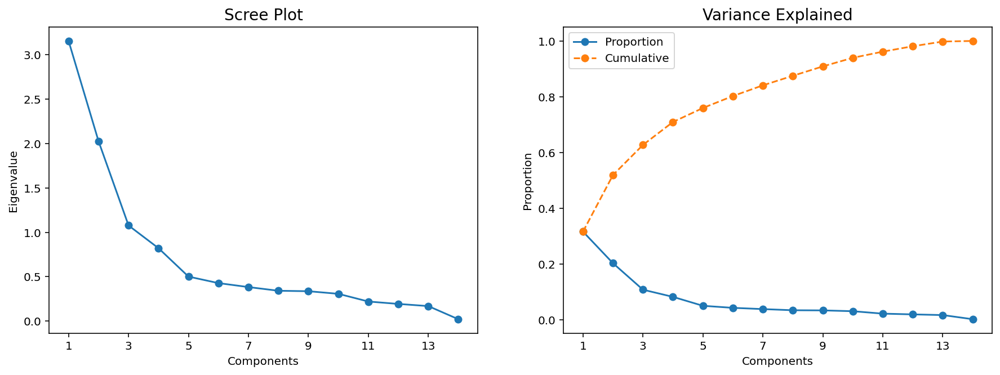

In [197]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [198]:
# Perform PCA again with the number of principal components you want to retain
pca = PCA(n_components=4)
pca_feat = pca.fit_transform(df1_pca)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df1 = pd.DataFrame(pca_feat, index=df1_pca.index, columns=pca_feat_names)  # remember index=df_pca.index
pca_df1

,PC0,PC1,PC2,PC3
CONTROLN,,,,
95515,-0.899967,-1.162456,0.402309,-0.047207
148535,3.498907,0.067950,0.637276,1.599784
15078,-1.452862,-1.124925,0.241174,0.787678
172556,-0.793331,-0.394966,-0.321296,0.751291
7112,-1.963340,1.598166,0.203267,0.418260
...,...,...,...,...
184568,1.038365,0.812793,-0.835610,-1.248274
122706,3.417865,-0.310395,-0.089108,1.013931
189641,-0.892723,1.511464,-0.973404,-1.254331


In [199]:
df1_pca = pd.concat([df1_pca, pca_df1], axis=1)
df1_pca.head()

,DOMAIN_Urban,DOMAIN_SES,INCOME,IC5,EC2,EC3,EC4,EC5,EC6,EC7,MARR1,MARR2,MARR3,MARR4,PC0,PC1,PC2,PC3
CONTROLN,,,,,,,,,,,,,,,,,,
95515,-0.5,0.0,-0.333333,-0.114415,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,0.000000,-0.6,1.2,-0.250,-0.899967,-1.162456,0.402309,-0.047207
148535,0.0,1.0,0.666667,3.041255,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,0.533333,-1.2,-0.6,0.375,3.498907,0.067950,0.637276,1.599784
15078,-1.0,0.0,-0.333333,-0.291492,1.777778,0.727273,-0.071429,-0.555556,0.0,-0.538462,0.133333,-0.2,0.6,-0.250,-1.452862,-1.124925,0.241174,0.787678
172556,-1.0,0.0,-1.333333,0.190015,2.444444,0.000000,-1.071429,0.666667,0.8,-0.692308,0.133333,-0.2,0.0,0.250,-0.793331,-0.394966,-0.321296,0.751291
7112,0.0,0.0,-0.333333,-0.527232,1.111111,0.727273,0.071429,-0.888889,-0.6,0.000000,-1.266667,1.4,0.6,1.500,-1.963340,1.598166,0.203267,0.418260


In [201]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df1_pca.corr().loc[pca_feat_names]
loadings.drop(['PC0','PC1','PC2','PC3'],axis = 1, inplace = True)
loadings.style.applymap(_color_red_or_green)

,DOMAIN_Urban,DOMAIN_SES,INCOME,IC5,EC2,EC3,EC4,EC5,EC6,EC7,MARR1,MARR2,MARR3,MARR4
PC0,0.171957,0.749983,0.476684,0.805640,-0.744026,-0.770301,-0.488720,0.486070,0.357952,0.824139,0.405698,-0.346449,-0.410542,-0.138970
PC1,0.550298,0.019468,0.019946,0.137705,-0.043714,-0.062773,-0.435245,0.141035,0.085423,0.274988,-0.763771,0.620064,-0.019007,0.880126
PC2,0.145702,0.041891,-0.001435,0.426479,0.167593,0.060531,-0.159455,-0.244719,-0.315709,0.135525,-0.147225,0.060207,0.802068,-0.212135
PC3,-0.156727,0.067303,0.135017,0.097643,0.423056,-0.035929,-0.281169,-0.610749,-0.275557,0.149845,-0.018705,-0.481708,-0.257094,0.218483


Conclusions from first pca:
- PC0: Higher SES, Higher Income, Higher Neighbourhood Income, Higher Education,Higher % People Married
- PC1: Higher Domain Urban, More frequent Higher Education, Higher % of Divorced/Separated and Single/Not married
- PC2: Both low education/higher education(standard neighbourhood) , Highest % Widow People that can inflate the IC5
- PC3: Lower Domain Urban, Low lvl of edcation

In [210]:
pca_df1.rename(columns = {'PC0': 'Rich_Neigh','PC1':'Single_Neigh', 'PC2':'Standard_Neigh', 'PC3':'Poor_Neigh'},inplace = True)

,Rich_Neigh,Single_Neigh,Standard_Neigh,Poor_Neigh
CONTROLN,,,,
95515,-0.899967,-1.162456,0.402309,-0.047207
148535,3.498907,0.067950,0.637276,1.599784
15078,-1.452862,-1.124925,0.241174,0.787678
172556,-0.793331,-0.394966,-0.321296,0.751291
7112,-1.963340,1.598166,0.203267,0.418260
...,...,...,...,...
184568,1.038365,0.812793,-0.835610,-1.248274
122706,3.417865,-0.310395,-0.089108,1.013931
189641,-0.892723,1.511464,-0.973404,-1.254331


In [152]:
df2_pca = data[['AC1','AC2','MALEMILI','MALEVET','FEDGOV','AFC1','AFC2','AFC3','AFC4','AFC5','AFC6','VC1','VC2','VC3','VC4']]


In [153]:
pca = PCA()
pca2_feat = pca.fit_transform(df2_pca)
pca2_feat  # What is this output?
#cov
cov_matrix2 = df2_pca.cov()
cov_matrix2

,AC1,AC2,MALEMILI,MALEVET,FEDGOV,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4
AC1,0.915430,0.246947,-0.003375,0.207631,-0.006162,-0.002962,-0.004556,-0.000784,0.247979,0.294613,-0.013009,-0.114379,0.393282,0.111562,-0.219360
AC2,0.246947,0.661036,-0.004224,0.257011,-0.057386,-0.003152,-0.005033,-0.000836,0.274646,0.348746,0.018280,-0.219139,0.176836,0.361697,-0.212517
MALEMILI,-0.003375,-0.004224,0.002566,-0.000388,0.038583,0.001157,0.001849,0.000298,0.002320,0.000328,0.011895,0.004310,-0.000675,-0.005796,0.012236
MALEVET,0.207631,0.257011,-0.000388,0.778542,0.219164,-0.000210,0.000121,-0.000093,0.463466,0.567222,0.120256,-0.038021,0.100223,0.179477,-0.118422
FEDGOV,-0.006162,-0.057386,0.038583,0.219164,1.918380,0.018176,0.029704,0.004748,0.182568,0.154187,0.306327,0.182796,0.039078,-0.153637,0.248259
AFC1,-0.002962,-0.003152,0.001157,-0.000210,0.018176,0.001005,0.001522,0.000275,0.000883,-0.000745,0.008423,0.002248,-0.001204,-0.004023,0.009973
AFC2,-0.004556,-0.005033,0.001849,0.000121,0.029704,0.001522,0.002404,0.000384,0.002008,-0.000515,0.013980,0.004236,-0.001551,-0.006567,0.015758
AFC3,-0.000784,-0.000836,0.000298,-0.000093,0.004748,0.000275,0.000384,0.000114,0.000155,-0.000256,0.002110,0.000522,-0.000360,-0.001045,0.002627
AFC4,0.247979,0.274646,0.002320,0.463466,0.182568,0.000883,0.002008,0.000155,0.566896,0.624584,0.225087,0.011936,0.124376,0.159707,-0.077161
AFC5,0.294613,0.348746,0.000328,0.567222,0.154187,-0.000745,-0.000515,-0.000256,0.624584,0.762091,0.156297,-0.029976,0.150764,0.248397,-0.141735


In [154]:
pd.DataFrame(pca.components_.T @ np.diag(pca.explained_variance_) @ pca.components_, 
             index=cov_matrix2.index, 
             columns=cov_matrix2.columns)

,AC1,AC2,MALEMILI,MALEVET,FEDGOV,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4
AC1,0.915430,0.246947,-0.003375,0.207631,-0.006162,-0.002962,-0.004556,-0.000784,0.247979,0.294613,-0.013009,-0.114379,0.393282,0.111562,-0.219360
AC2,0.246947,0.661036,-0.004224,0.257011,-0.057386,-0.003152,-0.005033,-0.000836,0.274646,0.348746,0.018280,-0.219139,0.176836,0.361697,-0.212517
MALEMILI,-0.003375,-0.004224,0.002566,-0.000388,0.038583,0.001157,0.001849,0.000298,0.002320,0.000328,0.011895,0.004310,-0.000675,-0.005796,0.012236
MALEVET,0.207631,0.257011,-0.000388,0.778542,0.219164,-0.000210,0.000121,-0.000093,0.463466,0.567222,0.120256,-0.038021,0.100223,0.179477,-0.118422
FEDGOV,-0.006162,-0.057386,0.038583,0.219164,1.918380,0.018176,0.029704,0.004748,0.182568,0.154187,0.306327,0.182796,0.039078,-0.153637,0.248259
AFC1,-0.002962,-0.003152,0.001157,-0.000210,0.018176,0.001005,0.001522,0.000275,0.000883,-0.000745,0.008423,0.002248,-0.001204,-0.004023,0.009973
AFC2,-0.004556,-0.005033,0.001849,0.000121,0.029704,0.001522,0.002404,0.000384,0.002008,-0.000515,0.013980,0.004236,-0.001551,-0.006567,0.015758
AFC3,-0.000784,-0.000836,0.000298,-0.000093,0.004748,0.000275,0.000384,0.000114,0.000155,-0.000256,0.002110,0.000522,-0.000360,-0.001045,0.002627
AFC4,0.247979,0.274646,0.002320,0.463466,0.182568,0.000883,0.002008,0.000155,0.566896,0.624584,0.225087,0.011936,0.124376,0.159707,-0.077161
AFC5,0.294613,0.348746,0.000328,0.567222,0.154187,-0.000745,-0.000515,-0.000256,0.624584,0.762091,0.156297,-0.029976,0.150764,0.248397,-0.141735


In [155]:
pd.DataFrame(df2_pca.values @ pca.components_.T, 
             index=df2_pca.index,
             columns=[f"PC{i}" for i in range(pca.n_components_)])

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14
CONTROLN,,,,,,,,,,,,,,,
95515,0.962336,-0.280574,0.624166,1.186662,0.564585,-1.065496,0.015875,0.248830,0.115501,0.003179,-0.086888,0.012080,-0.003870,0.000090,0.000122
148535,-2.162442,-0.043659,0.962881,0.582578,-1.110383,0.392996,0.758843,0.722003,0.422150,-0.052831,0.046072,0.019933,0.002290,-0.000346,-0.000324
15078,-1.113915,-0.481743,0.963117,-0.384667,0.101266,0.103374,-0.221316,0.026798,-0.130162,0.153515,0.036782,0.010020,0.000331,-0.000435,-0.000337
172556,-0.230470,-0.037625,1.632325,-0.722034,1.112437,-0.032403,-1.450584,-0.084273,-0.322588,0.033880,0.273479,-0.015499,0.001328,-0.000322,-0.000310
7112,0.680014,-0.159727,-0.650218,-1.351956,1.817112,0.616861,0.474244,0.558817,0.485276,0.231972,0.038858,-0.020192,-0.004943,0.008374,-0.001975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0.670953,4.625786,-0.463628,0.434901,0.502139,0.743540,0.035637,-0.099170,-0.028927,-0.025453,0.061007,0.082135,0.002312,-0.009063,-0.007844
122706,-0.569438,1.068586,-2.312332,1.518255,1.228798,2.388836,0.938260,-0.615493,0.232685,-0.263052,0.232216,-0.053019,-0.014384,0.002200,0.001146
189641,-2.155582,-0.080794,-0.897342,-0.190176,-0.253993,-0.374200,0.228374,2.024836,0.803090,0.118539,0.021078,0.004780,-0.005765,-0.000615,-0.000485


In [156]:
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,2.611944,0.000000,0.284887,0.284887
2,2.191332,-0.420612,0.239010,0.523897
3,1.044275,-1.147057,0.113900,0.637797
4,0.899221,-0.145054,0.098079,0.735876
5,0.738399,-0.160822,0.080538,0.816414
6,0.500111,-0.238288,0.054548,0.870962
7,0.430613,-0.069499,0.046967,0.917929
8,0.341231,-0.089382,0.037218,0.955147
9,0.228388,-0.112843,0.024910,0.980058
10,0.157103,-0.071285,0.017135,0.997193


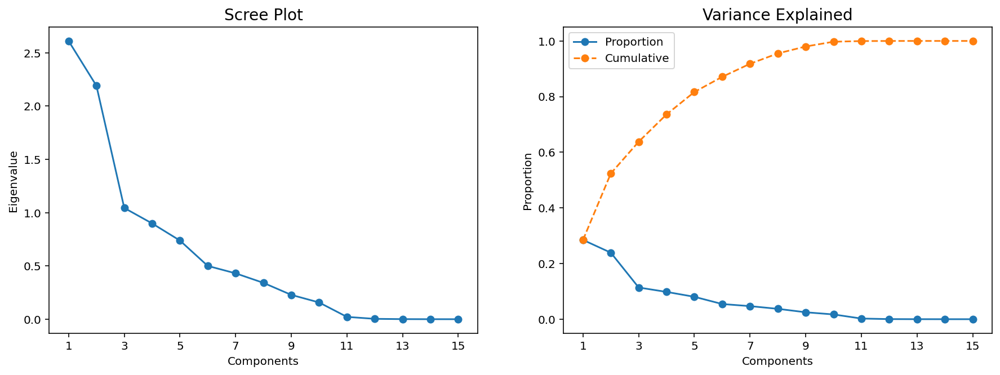

In [157]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [158]:
# Perform PCA again with the number of principal components you want to retain
pca = PCA(n_components=3)
pca_feat = pca.fit_transform(df2_pca)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df2 = pd.DataFrame(pca_feat, index=df2_pca.index, columns=pca_feat_names)  # remember index=df_pca.index
pca_df2

,PC0,PC1,PC2
CONTROLN,,,
95515,0.852402,-0.672389,0.620387
148535,-2.272375,-0.435474,0.959103
15078,-1.223848,-0.873557,0.959338
172556,-0.340403,-0.429439,1.628547
7112,0.570080,-0.551541,-0.653996
...,...,...,...
184568,0.561020,4.233972,-0.467406
122706,-0.679371,0.676772,-2.316111
189641,-2.265516,-0.472609,-0.901120


In [159]:
df2_pca = pd.concat([df2_pca, pca_df2], axis=1)
df2_pca.head()

,AC1,AC2,MALEMILI,MALEVET,FEDGOV,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,PC0,PC1,PC2
CONTROLN,,,,,,,,,,,,,,,,,,
95515,1.333333,0.25,0.00,0.615385,-0.333333,0.00,0.00,0.00,0.428571,0.666667,-0.5,0.222222,0.545455,-0.666667,0.583333,0.852402,-0.672389,0.620387
148535,0.000000,-0.25,0.00,-1.230769,-0.333333,0.00,0.00,0.00,-1.000000,-1.333333,-0.5,1.388889,-0.636364,-1.000000,-0.750000,-2.272375,-0.435474,0.959103
15078,0.000000,-0.25,0.00,-0.846154,-0.333333,0.00,0.00,0.00,-0.714286,-0.833333,-0.5,-0.111111,0.545455,0.000000,-0.083333,-1.223848,-0.873557,0.959338
172556,0.000000,0.00,0.00,-0.615385,0.333333,0.00,0.00,0.00,-0.285714,-0.666667,-0.5,-0.888889,2.090909,-0.047619,0.583333,-0.340403,-0.429439,1.628547
7112,0.333333,1.25,0.01,-0.230769,0.000000,0.01,0.01,0.01,0.000000,-0.250000,1.5,-1.166667,-0.090909,1.000000,0.916667,0.570080,-0.551541,-0.653996


In [161]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df2_pca.corr().loc[pca_feat_names]
loadings.drop(['PC0','PC1','PC2'],axis = 1, inplace = True)
loadings.style.applymap(_color_red_or_green)

,AC1,AC2,MALEMILI,MALEVET,FEDGOV,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4
PC0,0.564521,0.650432,0.063338,0.764908,0.281487,0.003721,0.017148,-0.002951,0.854929,0.877700,0.260553,-0.201022,0.407574,0.477061,-0.316233
PC1,-0.227292,-0.324862,0.563862,0.059355,0.901856,0.481131,0.507237,0.372193,0.068212,-0.022451,0.383398,0.373138,-0.149826,-0.428600,0.473446
PC2,0.559234,-0.063759,0.042607,-0.293923,0.178766,-0.041597,-0.042495,-0.030209,-0.294597,-0.285637,-0.313034,0.055250,0.671879,-0.225659,-0.276014


- PC0 -->  Adults with more than 55 years(neighbourhood), High % MaleVET in the neighbourhood,Percent WW2/Korean Veterans Age 16+;
- PC1 --> Younger people living around, Active Militar lviing around,high %federal gov employers,% Vietnam Veterans,%Veterans from IRAQ p.e;
- PC2 --> Adults with age 55-59, Korean % Veteran

In [214]:
pca_df2.rename(columns = {'PC0':'Vet_WW2','PC1':'Fed_Act_Vietnam','PC2':'Korean_Vet'}, inplace = True)

In [215]:
pca_df2

,Vet_WW2,Fed_Act_Vietnam,Korean_Vet
CONTROLN,,,
95515,0.852402,-0.672389,0.620387
148535,-2.272375,-0.435474,0.959103
15078,-1.223848,-0.873557,0.959338
172556,-0.340403,-0.429439,1.628547
7112,0.570080,-0.551541,-0.653996
...,...,...,...
184568,0.561020,4.233972,-0.467406
122706,-0.679371,0.676772,-2.316111
189641,-2.265516,-0.472609,-0.901120


In [219]:
reduced_df = pd.concat([pca_df1,pca_df2], axis = 1)

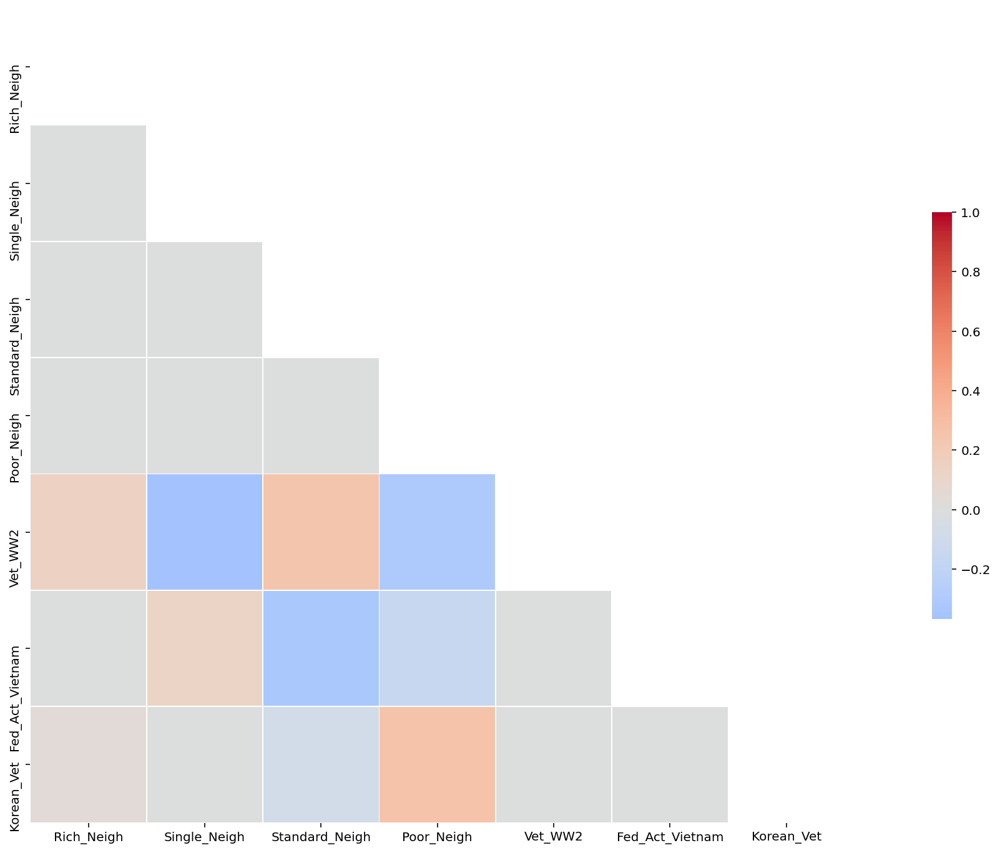

In [224]:
heatmap(reduced_df,'pearson')

In [240]:
selected_df = pd.concat([data[['Age','AVGGIFT']],reduced_df], axis = 1)

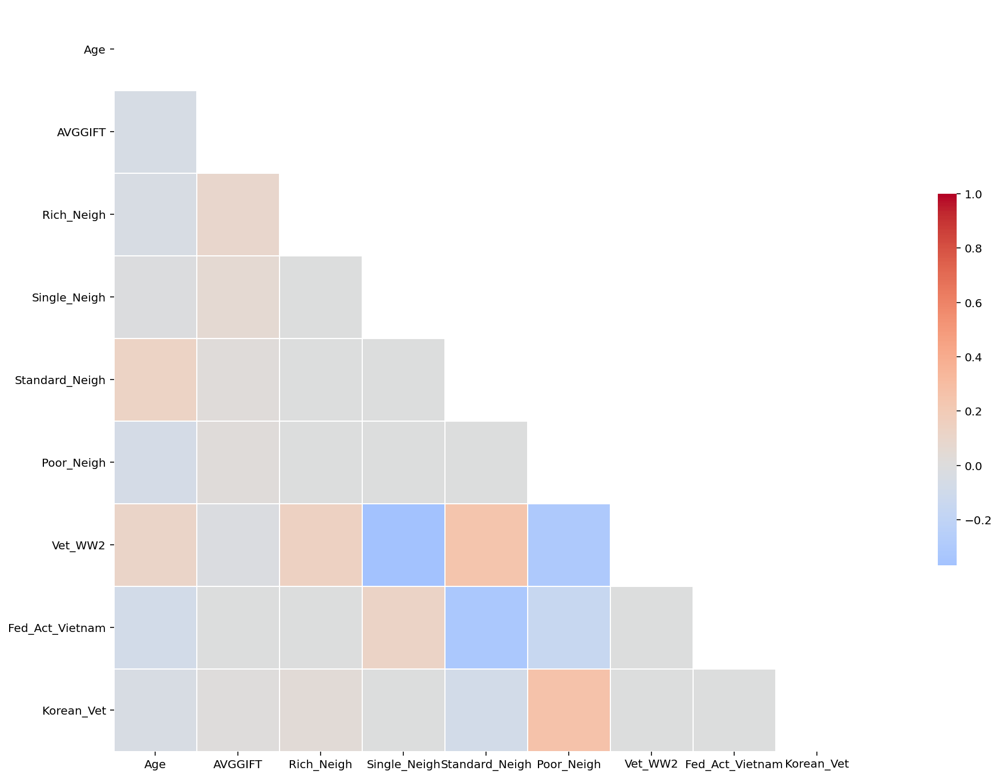

In [241]:
heatmap(selected_df,'pearson')

#### Dimension Reduction via SOM for Interests data

In [268]:
interests_data

,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES
CONTROLN,,,,,,,,,,,,,,,,,,
95515,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
148535,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
15078,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
172556,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7112,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
122706,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
189641,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Since interests features are all binary, it was decided to calculate the distance using jaccard index from each variable, in other to get a better notion of the relationship between each other

#### Jaccard Index/Distance

In [271]:
jac_sim = 1 - pairwise_distances(interests_data.T, metric = "hamming")

jac_sim = pd.DataFrame(jac_sim, index=interests_data.columns, columns=interests_data.columns)

In [272]:
jac_sim

,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES
COLLECT1,1.000000,0.874586,0.886021,0.894384,0.940186,0.850040,0.862030,0.865614,0.872123,0.919591,0.900620,0.897497,0.858865,0.931644,0.873569,0.939463,0.944315,0.951348
VETERANS,0.874586,1.000000,0.854934,0.860552,0.886251,0.835094,0.845785,0.836981,0.846382,0.874041,0.858529,0.867543,0.841739,0.883683,0.853383,0.884564,0.887991,0.890140
BIBLE,0.886021,0.854934,1.000000,0.870058,0.903073,0.835650,0.841561,0.854934,0.853121,0.888347,0.876546,0.875917,0.852922,0.895810,0.871148,0.901260,0.905043,0.905662
CATLG,0.894384,0.860552,0.870058,1.000000,0.918103,0.861684,0.878705,0.873234,0.877101,0.899541,0.885287,0.885434,0.859211,0.908974,0.867501,0.908303,0.912359,0.914759
HOMEE,0.940186,0.886251,0.903073,0.918103,1.000000,0.852230,0.873213,0.865814,0.892466,0.944441,0.911091,0.920607,0.859567,0.970937,0.887247,0.975443,0.980443,0.985274
PETS,0.850040,0.835094,0.835650,0.861684,0.852230,1.000000,0.874376,0.859158,0.867532,0.853708,0.860248,0.859976,0.866474,0.854505,0.846089,0.843772,0.846235,0.848552
CDPLAY,0.862030,0.845785,0.841561,0.878705,0.873213,0.874376,1.000000,0.893871,0.897696,0.874586,0.859494,0.860542,0.854379,0.873580,0.856611,0.863602,0.866694,0.869241
STEREO,0.865614,0.836981,0.854934,0.873234,0.865814,0.859158,0.893871,1.000000,0.868350,0.881461,0.868297,0.860688,0.859158,0.867061,0.866212,0.858886,0.862145,0.864126
PCOWNERS,0.872123,0.846382,0.853121,0.877101,0.892466,0.867532,0.897696,0.868350,1.000000,0.885371,0.866862,0.865499,0.848436,0.888620,0.854169,0.881262,0.884040,0.887069
PHOTO,0.919591,0.874041,0.888347,0.899541,0.944441,0.853708,0.874586,0.881461,0.885371,1.000000,0.902067,0.905819,0.867354,0.939567,0.883023,0.937639,0.941988,0.945835


In [345]:
df_with_interests = pd.concat([selected_df,interests_data], axis = 1)
df_with_interests

,Age,AVGGIFT,Rich_Neigh,Single_Neigh,Standard_Neigh,Poor_Neigh,Vet_WW2,Fed_Act_Vietnam,Korean_Vet,COLLECT1,...,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES
CONTROLN,,,,,,,,,,,,,,,,,,,,,
95515,0.045455,-0.549026,-0.899967,-1.162456,0.402309,-0.047207,0.852402,-0.672389,0.620387,0,...,0,0,0,0,0,0,0,0,0,0
148535,-0.636364,0.568181,3.498907,0.067950,0.637276,1.599784,-2.272375,-0.435474,0.959103,0,...,0,0,0,0,0,0,0,0,0,0
15078,-0.136364,-0.585744,-1.452862,-1.124925,0.241174,0.787678,-1.223848,-0.873557,0.959338,0,...,0,0,0,0,0,0,0,0,0,0
172556,0.454545,-0.680055,-0.793331,-0.394966,-0.321296,0.751291,-0.340403,-0.429439,1.628547,0,...,0,0,0,0,0,0,0,0,0,0
7112,0.818182,-0.672673,-1.963340,1.598166,0.203267,0.418260,0.570080,-0.551541,-0.653996,0,...,0,0,1,0,1,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0.000000,1.883970,1.038365,0.812793,-0.835610,-1.248274,0.561020,4.233972,-0.467406,0,...,0,0,0,0,0,0,0,0,0,0
122706,-0.545455,1.179083,3.417865,-0.310395,-0.089108,1.013931,-0.679371,0.676772,-2.316111,0,...,0,0,0,0,0,0,0,0,0,0
189641,0.000000,-0.472366,-0.892723,1.511464,-0.973404,-1.254331,-2.265516,-0.472609,-0.901120,0,...,0,0,0,0,0,0,0,0,0,0


#### SOM Implementation

In [388]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(30)

som_interests = sompy.SOMFactory().build(
    selected_df.values, 
    mapsize=(50, 50),
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=selected_df.columns
)
som_interests.train(n_job=-1, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 random_initialization took: 0.002000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 100

 epoch: 1 ---> elapsed time:  4.713000, quantization error: 5.701806

 epoch: 2 ---> elapsed time:  4.797000, quantization error: 2.706024

 epoch: 3 ---> elapsed time:  5.467000, quantization error: 2.693860

 epoch: 4 ---> elapsed time:  4.774000, quantization error: 2.686758

 epoch: 5 ---> elapsed time:  4.831000, quantization error: 2.683720

 epoch: 6 ---> elapsed time:  4.704000, quantization error: 2.682243

 epoch: 7 ---> elapsed time:  4.963000, quantization error: 2.681197

 epoch: 8 ---> elapsed time:  5.177000, quantization error: 2.680350

 epoch: 9 ---> elapsed time:  4.912000, quantization error: 2.679614

 epoch: 10 ---> elapsed time:  5.198000, quantization error: 2.678927

 epoch: 11 ---> elapsed time:  5.061000, quantization error: 2.678222

 epoch: 12 ---> elapsed time:  5.007000, quantization error: 2.677485

 epoch: 13 --->

In [389]:
# Coordinates of the units in the input space
som_interests.get_node_vectors()

array([[ 0.32783627,  0.20399857, -1.27226655, ...,  0.83101077,
        -0.63331825, -1.46359011],
       [ 0.28303524,  0.18974157, -0.85523945, ...,  0.86367947,
        -0.74371214, -1.31085909],
       [ 0.29582417,  0.1377726 , -0.74560908, ...,  1.05060413,
        -0.9096886 , -1.31340973],
       ...,
       [-0.25483828,  0.37536044,  0.90706472, ..., -2.37427492,
         0.09088197,  0.04410999],
       [-0.22382076,  0.32858867,  0.43396109, ..., -2.78849224,
         0.2361208 , -0.09181295],
       [-0.16126135,  0.24448603, -0.01809585, ..., -3.21187147,
         0.37808076, -0.24022136]])

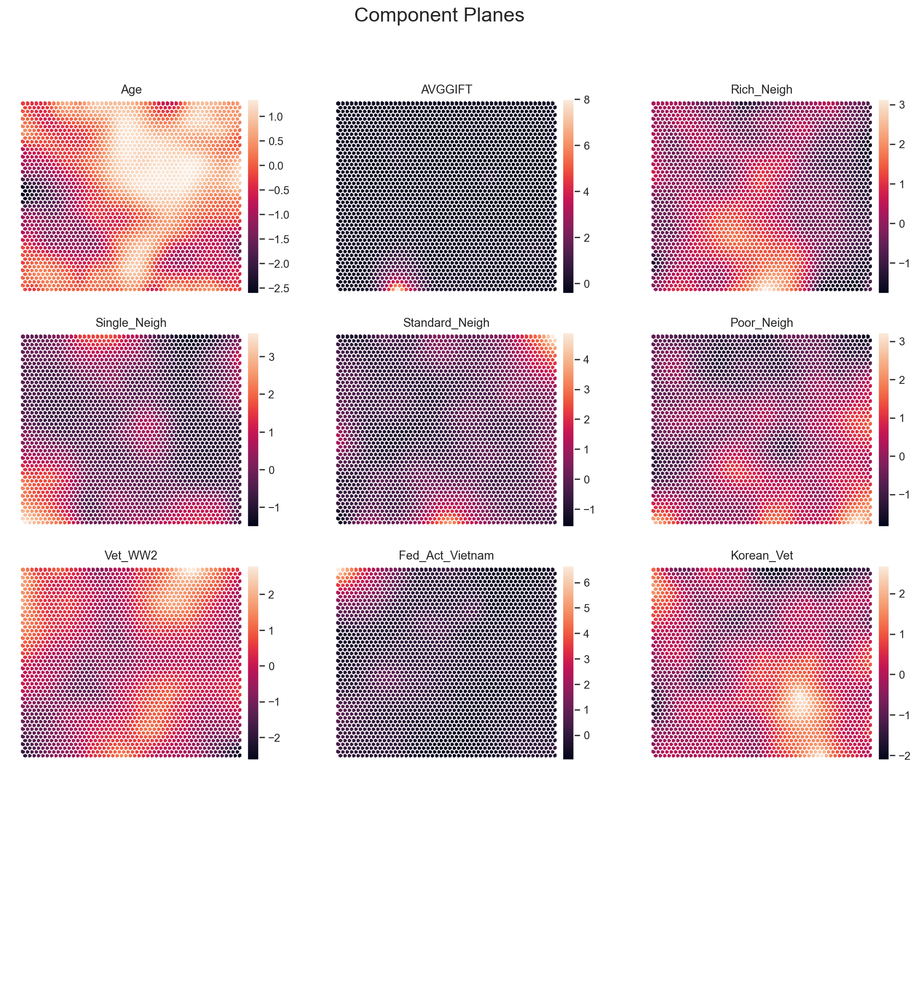

In [390]:
# Component planes on the 50x50 grid
sns.set()
view2D = View2D(12,12,"", text_size=10)
view2D.show(som_interests, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

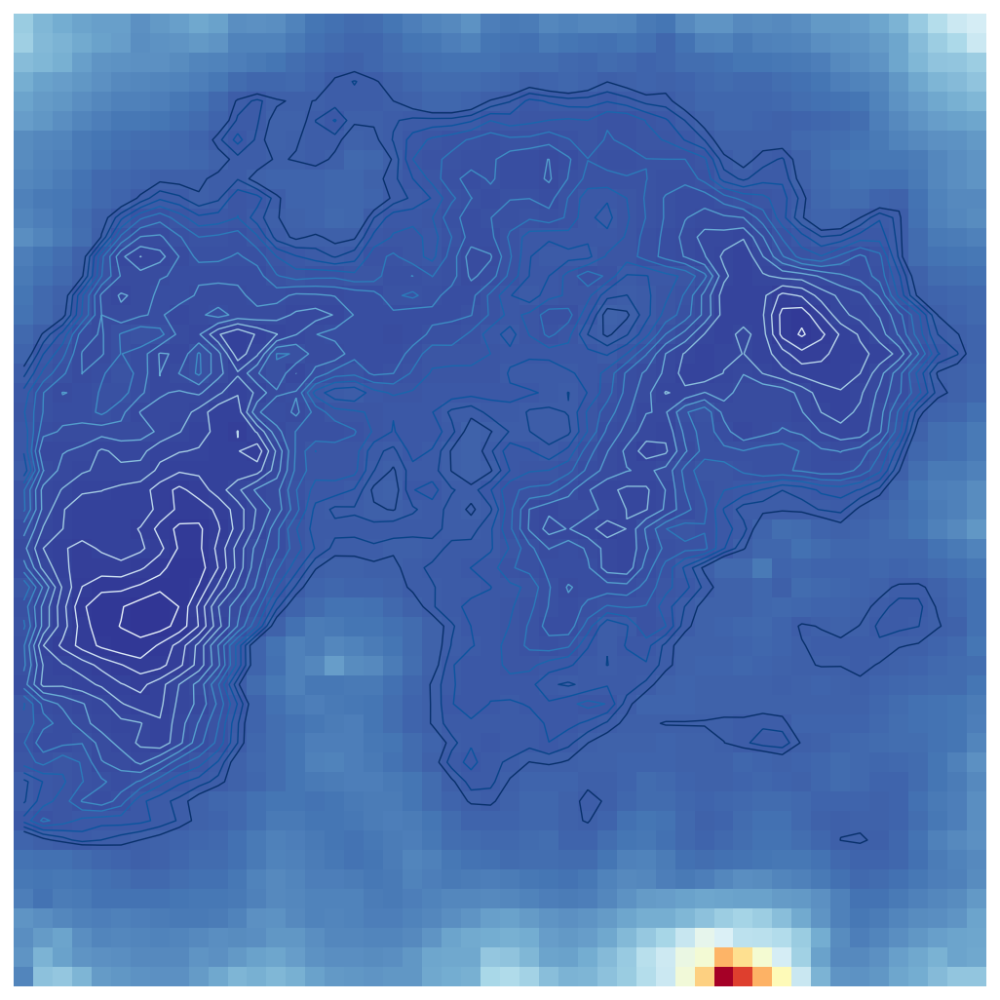

In [391]:
# U-matrix of the 50x50 grid
u = sompy.umatrix.UMatrixView(12, 12, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    som_interests, 
    distance2=1, 
    row_normalized=False, 
    show_data=False, 
    contooor=True # Visualize isomorphic curves
)

##### Kmeans + SOM

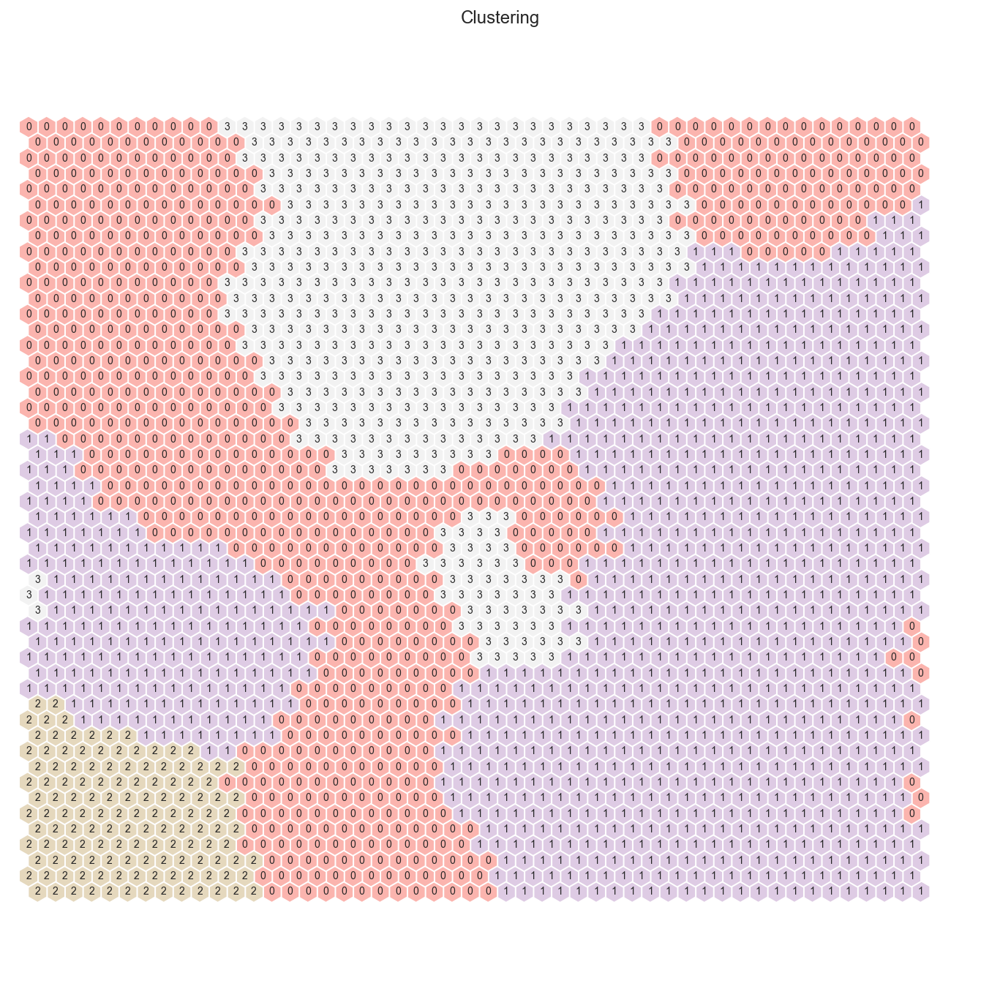

In [429]:
# Perform K-Means clustering on top of the 2500 untis (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=18, random_state=50)
nodeclus_labels = som_interests.cluster(kmeans)

hits  = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(som_interests, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [430]:
# Check the nodes and and respective clusters
nodes = som_interests.get_node_vectors()

df_nodes = pd.DataFrame(nodes, columns=selected_df.columns)
df_nodes['label'] = nodeclus_labels
df_nodes

,Age,AVGGIFT,Rich_Neigh,Single_Neigh,Standard_Neigh,Poor_Neigh,Vet_WW2,Fed_Act_Vietnam,Korean_Vet,label
0,0.327836,0.203999,-1.272267,-0.289979,5.086329,-1.668773,0.831011,-0.633318,-1.463590,1
1,0.283035,0.189742,-0.855239,-0.403702,4.472236,-1.459864,0.863679,-0.743712,-1.310859,1
2,0.295824,0.137773,-0.745609,-0.596850,3.818372,-1.355537,1.050604,-0.909689,-1.313410,1
3,0.397208,0.094985,-0.696628,-0.869359,3.271879,-1.222534,1.363166,-1.002055,-1.413285,1
4,0.469143,0.062104,-0.594767,-1.203706,2.885574,-1.149156,1.826160,-1.070978,-1.623110,1
...,...,...,...,...,...,...,...,...,...,...
2495,-0.012257,0.361891,1.646262,3.891312,0.400580,1.200869,-1.721628,-0.193441,0.167062,0
2496,-0.124540,0.392460,1.303008,4.074057,-0.047372,1.424305,-2.017980,-0.081162,0.153588,0
2497,-0.254838,0.375360,0.907065,4.319423,-0.528252,1.644468,-2.374275,0.090882,0.044110,0
2498,-0.223821,0.328589,0.433961,4.695189,-1.068872,1.946211,-2.788492,0.236121,-0.091813,0


In [431]:
# Obtaining SOM's BMUs labels
bmus_map = som_interests.find_bmu(selected_df)[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((df_with_interests, np.expand_dims(bmus_map,1)), axis=1),
    index=selected_df.index, columns=np.append(df_with_interests.columns,"BMU")
)
df_bmus

,Age,AVGGIFT,Rich_Neigh,Single_Neigh,Standard_Neigh,Poor_Neigh,Vet_WW2,Fed_Act_Vietnam,Korean_Vet,COLLECT1,...,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,BMU
CONTROLN,,,,,,,,,,,,,,,,,,,,,
95515,0.045455,-0.549026,-0.899967,-1.162456,0.402309,-0.047207,0.852402,-0.672389,0.620387,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1562.0
148535,-0.636364,0.568181,3.498907,0.067950,0.637276,1.599784,-2.272375,-0.435474,0.959103,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1781.0
15078,-0.136364,-0.585744,-1.452862,-1.124925,0.241174,0.787678,-1.223848,-0.873557,0.959338,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1253.0
172556,0.454545,-0.680055,-0.793331,-0.394966,-0.321296,0.751291,-0.340403,-0.429439,1.628547,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1213.0
7112,0.818182,-0.672673,-1.963340,1.598166,0.203267,0.418260,0.570080,-0.551541,-0.653996,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,28.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0.000000,1.883970,1.038365,0.812793,-0.835610,-1.248274,0.561020,4.233972,-0.467406,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45.0
122706,-0.545455,1.179083,3.417865,-0.310395,-0.089108,1.013931,-0.679371,0.676772,-2.316111,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1584.0
189641,0.000000,-0.472366,-0.892723,1.511464,-0.973404,-1.254331,-2.265516,-0.472609,-0.901120,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2046.0


In [432]:
# Get cluster labels for each observation
df_final = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)


In [433]:
df_final['label'].unique()

array([1, 3, 0, 2])

In [434]:
df_final.drop(columns='BMU').groupby('label').mean()

,Age,AVGGIFT,Rich_Neigh,Single_Neigh,Standard_Neigh,Poor_Neigh,Vet_WW2,Fed_Act_Vietnam,Korean_Vet,COLLECT1,...,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES
label,,,,,,,,,,,,,,,,,,,,,
0,-0.074740,0.183210,-0.524560,1.210877,-0.299379,-0.001433,-1.294563,0.151279,-0.141648,0.050879,...,0.099544,0.048362,0.074205,0.062022,0.119815,0.015841,0.097631,0.015539,0.009800,0.005672
1,0.052965,-0.045675,-0.813034,-0.894978,0.236093,-0.076322,0.669760,-0.557558,-0.131079,0.057763,...,0.083899,0.046132,0.095671,0.089334,0.148421,0.022503,0.110598,0.017546,0.011660,0.006309
2,-0.071663,0.112760,0.191471,-0.176855,-0.549280,-0.412759,1.300467,3.217835,0.348071,0.063079,...,0.134181,0.054314,0.103444,0.092334,0.163930,0.023454,0.121466,0.018269,0.014566,0.007530
3,-0.066738,0.830135,1.951430,-0.130343,0.226603,0.277010,0.193409,-0.489731,0.275130,0.051072,...,0.156716,0.057570,0.078608,0.061887,0.146947,0.025763,0.121819,0.013722,0.009860,0.004816


In [435]:
df_final

,Age,AVGGIFT,Rich_Neigh,Single_Neigh,Standard_Neigh,Poor_Neigh,Vet_WW2,Fed_Act_Vietnam,Korean_Vet,COLLECT1,...,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,BMU,label
CONTROLN,,,,,,,,,,,,,,,,,,,,,
95515,0.045455,-0.549026,-0.899967,-1.162456,0.402309,-0.047207,0.852402,-0.672389,0.620387,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1562.0,1
148535,-0.636364,0.568181,3.498907,0.067950,0.637276,1.599784,-2.272375,-0.435474,0.959103,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1781.0,3
15078,-0.136364,-0.585744,-1.452862,-1.124925,0.241174,0.787678,-1.223848,-0.873557,0.959338,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1253.0,1
172556,0.454545,-0.680055,-0.793331,-0.394966,-0.321296,0.751291,-0.340403,-0.429439,1.628547,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1213.0,1
7112,0.818182,-0.672673,-1.963340,1.598166,0.203267,0.418260,0.570080,-0.551541,-0.653996,0.0,...,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,28.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0.000000,1.883970,1.038365,0.812793,-0.835610,-1.248274,0.561020,4.233972,-0.467406,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45.0,2
122706,-0.545455,1.179083,3.417865,-0.310395,-0.089108,1.013931,-0.679371,0.676772,-2.316111,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1584.0,3
189641,0.000000,-0.472366,-0.892723,1.511464,-0.973404,-1.254331,-2.265516,-0.472609,-0.901120,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2046.0,0


In [436]:
# using R^2
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_final[selected_df.columns])  # get total sum of squares
ssw_labels = df_final[selected_df.columns.to_list() + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.2644978533977698

## Promotions Importance / Donors Behaviour before last promo

In [477]:
labeled_data = df_final.copy()
labeled_data

,Age,AVGGIFT,Rich_Neigh,Single_Neigh,Standard_Neigh,Poor_Neigh,Vet_WW2,Fed_Act_Vietnam,Korean_Vet,COLLECT1,...,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,BMU,label
CONTROLN,,,,,,,,,,,,,,,,,,,,,
95515,0.045455,-0.549026,-0.899967,-1.162456,0.402309,-0.047207,0.852402,-0.672389,0.620387,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1562.0,1
148535,-0.636364,0.568181,3.498907,0.067950,0.637276,1.599784,-2.272375,-0.435474,0.959103,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1781.0,3
15078,-0.136364,-0.585744,-1.452862,-1.124925,0.241174,0.787678,-1.223848,-0.873557,0.959338,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1253.0,1
172556,0.454545,-0.680055,-0.793331,-0.394966,-0.321296,0.751291,-0.340403,-0.429439,1.628547,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1213.0,1
7112,0.818182,-0.672673,-1.963340,1.598166,0.203267,0.418260,0.570080,-0.551541,-0.653996,0.0,...,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,28.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0.000000,1.883970,1.038365,0.812793,-0.835610,-1.248274,0.561020,4.233972,-0.467406,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45.0,2
122706,-0.545455,1.179083,3.417865,-0.310395,-0.089108,1.013931,-0.679371,0.676772,-2.316111,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1584.0,3
189641,0.000000,-0.472366,-0.892723,1.511464,-0.973404,-1.254331,-2.265516,-0.472609,-0.901120,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2046.0,0


### RFA

RFA or RFM stands for Recency, Frequency, and Amount/Monetary value, each corresponding to some key customer trait. These RFM metrics are important indicators of a customer’s behavior because frequency and monetary value affects a customer’s lifetime value, and recency affects retention, a measure of engagement.

Since the objective of this study, is to find out clusters that are associated with all lapsed donors, it was decided that one approach to deal with RFA would be to try to search for patterns from the historical behaviour of all donors in this dataset.

The thought process behind the following steps are to separate the RFA into multiple new features(like feature engineering) (in the format of RFA_2R p.e). 
After, it will be put together 2 cells, corresponding to the behaviour of each donor from a promotion to another(p.e if a donor passes from a lapsed donor into an active donor thanks to a promotion).
Finally, it will be count by descending order, the importance of a promotion into turning a lapsed/an inactive donor into a star/active one.

Finally, this will be used as a possible marketing approach to define the best strategy to take back lapsed/inactive donors

In [442]:
data_rfa = data[[col for col in data if col.startswith('RFA')]]

In [443]:
#Recency to check out the behaviour of each donor and 
#possibly what was the type of promotion that led to a lapsed donor to become an active donor
for i in range(2,25):
    data['RFA_'+str(i)+'R'] = data['RFA_'+ str(i)].str.split('',expand=True)[1]

- Behaviours that we are looking for : L --> S; L--> A; I--> S; I --> A

In [444]:
data_rfa_r = data.iloc[:,-23:]

In [445]:
data_rfa_r[data_rfa_r['RFA_17R'].astype(str).str.contains('P')]

,RFA_2R,RFA_3R,RFA_4R,RFA_5R,RFA_6R,RFA_7R,RFA_8R,RFA_9R,RFA_10R,RFA_11R,...,RFA_15R,RFA_16R,RFA_17R,RFA_18R,RFA_19R,RFA_20R,RFA_21R,RFA_22R,RFA_23R,RFA_24R
CONTROLN,,,,,,,,,,,,,,,,,,,,,
15419,L,A,A,A,N,N,N,N,N,N,...,,,P,P,,,,,,
178309,L,A,A,,N,N,N,N,F,F,...,,,P,P,,,,,,
118016,L,A,A,,N,N,N,N,F,F,...,,,P,P,,,,,,
108888,L,A,A,A,N,N,N,N,N,N,...,N,,P,P,,,,,,
56803,L,N,N,,N,F,F,F,F,F,...,,,P,P,,,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170118,L,A,A,,N,N,N,N,N,N,...,,,P,P,,,,,,
56972,L,A,A,A,N,N,N,N,N,N,...,,,P,P,,,,,,
139193,L,A,A,,N,N,N,N,F,F,...,,,P,P,,,,,,


- After some exploration, we notice that Letter P tends to identify the first time someone who has not donated yet but eventually will/First time he/she donated --> F
- So, it was decided to replace P for F , to avoid inconsistencies

In [446]:
data_rfa_r.replace(' ', np.nan, inplace = True)

- In order to get this method as accurate as possible, it was decided to use bfill method so promotions would be cronologically accurate. 

In [447]:
data_rfa_r.T.fillna(method='bfill',inplace=True)

In [448]:
rfa = data_rfa_r.T

In [449]:
rfa.fillna(method='bfill',inplace=True)

In [450]:
#people that until that moment where not donors but eventually, they'll be.
rfa.replace(np.nan, 'P', inplace = True)

In [451]:
rfa.fillna(method='bfill',inplace=True)

In [452]:
#reversing again to normal format
rfa_r = rfa.T

In [453]:
rfa_r

,RFA_2R,RFA_3R,RFA_4R,RFA_5R,RFA_6R,RFA_7R,RFA_8R,RFA_9R,RFA_10R,RFA_11R,...,RFA_15R,RFA_16R,RFA_17R,RFA_18R,RFA_19R,RFA_20R,RFA_21R,RFA_22R,RFA_23R,RFA_24R
CONTROLN,,,,,,,,,,,,,,,,,,,,,
95515,L,S,S,S,S,S,S,S,S,S,...,S,S,S,S,S,S,S,S,S,S
148535,L,A,A,A,A,A,A,A,A,A,...,L,L,N,N,N,N,N,N,F,F
15078,L,S,S,S,S,S,S,S,S,S,...,S,S,S,S,S,S,S,S,S,S
172556,L,S,S,S,S,S,S,S,S,S,...,S,S,S,S,A,A,A,A,P,P
7112,L,A,A,A,A,I,A,A,L,A,...,L,L,A,A,A,A,A,I,A,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,L,F,F,F,F,P,P,P,P,P,...,P,P,P,P,P,P,P,P,P,P
122706,L,P,P,P,P,P,P,P,P,P,...,P,P,P,P,P,P,P,P,P,P
189641,L,S,S,S,S,A,A,N,N,N,...,N,F,F,F,P,P,P,P,P,P


- The first column will be dropped for the sake of this type of analysis where the most recent promo doesnt have any influence in the history/behaviour of the donor(--> for last promotion, they are all lapsed donors)


In [454]:
rfa_r.drop('RFA_2R',axis = 1,inplace = True)

In [455]:
hey = rfa_r.copy()

### Promotions importance to turn a lapsed/inactive into active/star

In [456]:
#grouping  columns, so we can have the respect order of events/state of donor

promo_al = ['AL']
promo_sl = ['SL']
promo_ai = ['AI']
promo_si = ['SI']


matched_al = (hey.shift(axis = 1) + hey).isin(promo_al)
matched_sl = (hey.shift(axis = 1) + hey).isin(promo_sl)
matched_ai = (hey.shift(axis = 1) + hey).isin(promo_ai)
matched_si = (hey.shift(axis = 1) + hey).isin(promo_si)

In [457]:
hhhh= (hey.shift(axis = 1) + hey)
hhhh

,RFA_3R,RFA_4R,RFA_5R,RFA_6R,RFA_7R,RFA_8R,RFA_9R,RFA_10R,RFA_11R,RFA_12R,...,RFA_15R,RFA_16R,RFA_17R,RFA_18R,RFA_19R,RFA_20R,RFA_21R,RFA_22R,RFA_23R,RFA_24R
CONTROLN,,,,,,,,,,,,,,,,,,,,,
95515,NaN,SS,SS,SS,SS,SS,SS,SS,SS,SS,...,SS,SS,SS,SS,SS,SS,SS,SS,SS,SS
148535,NaN,AA,AA,AA,AA,AA,AA,AA,AA,AA,...,LL,LL,LN,NN,NN,NN,NN,NN,NF,FF
15078,NaN,SS,SS,SS,SS,SS,SS,SS,SS,SS,...,SS,SS,SS,SS,SS,SS,SS,SS,SS,SS
172556,NaN,SS,SS,SS,SS,SS,SS,SS,SS,SS,...,SS,SS,SS,SS,SA,AA,AA,AA,AP,PP
7112,NaN,AA,AA,AA,AI,IA,AA,AL,LA,AA,...,LL,LL,LA,AA,AA,AA,AA,AI,IA,AA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,NaN,FF,FF,FF,FP,PP,PP,PP,PP,PP,...,PP,PP,PP,PP,PP,PP,PP,PP,PP,PP
122706,NaN,PP,PP,PP,PP,PP,PP,PP,PP,PP,...,PP,PP,PP,PP,PP,PP,PP,PP,PP,PP
189641,NaN,SS,SS,SS,SA,AA,AN,NN,NN,NN,...,NN,NF,FF,FF,FP,PP,PP,PP,PP,PP


In [458]:
AL = matched_al.columns[(matched_al == True).any()].tolist()
SL = matched_sl.columns[(matched_sl == True).any()].tolist()
AI = matched_ai.columns[(matched_ai == True).any()].tolist()
SI = matched_si.columns[(matched_si == True).any()].tolist()

In [459]:
print('Lapsed --> Active: ',len(matched_al[(matched_al == True).any(axis = 1)]))
print('Lapsed --> Star: ', len(matched_sl[(matched_sl == True).any(axis = 1)]))
print('Inactive --> Active: ',len(matched_ai[(matched_ai == True).any(axis = 1)]))
print('Inactive --> Star: ',len(matched_si[(matched_si == True).any(axis = 1)]))

Lapsed --> Active:  23257
Lapsed --> Star:  700
Inactive --> Active:  5145
Inactive --> Star:  318


#### Counting / Impact of Promotions in donor behaviour

In [460]:
#Lapsed --> Active(Promotions Effect counting)
matched_al[(matched_al == True).any(axis = 1)].sum().sort_values(ascending = False)

RFA_7R     3908
RFA_17R    3342
RFA_6R     2664
RFA_13R    2638
RFA_15R    2290
RFA_5R     2092
RFA_9R     2017
RFA_14R    1599
RFA_19R    1308
RFA_20R     644
RFA_10R     633
RFA_24R     528
RFA_23R     518
RFA_16R     239
RFA_11R      58
RFA_18R      15
RFA_4R       11
RFA_8R       10
RFA_12R       5
RFA_21R       2
RFA_22R       1
RFA_3R        0
dtype: int64

In [461]:
matched_sl[(matched_sl == True).any(axis = 1)].sum().sort_values(ascending = False)

RFA_17R    117
RFA_7R     116
RFA_13R    115
RFA_15R     93
RFA_6R      69
RFA_10R     42
RFA_5R      42
RFA_23R     30
RFA_16R     22
RFA_19R     19
RFA_9R      16
RFA_20R     12
RFA_24R      9
RFA_11R      4
RFA_14R      4
RFA_21R      3
RFA_12R      1
RFA_4R       1
RFA_8R       0
RFA_18R      0
RFA_22R      0
RFA_3R       0
dtype: int64

In [462]:
matched_ai[(matched_ai == True).any(axis = 1)].sum().sort_values(ascending = False)

RFA_15R    886
RFA_7R     632
RFA_14R    551
RFA_17R    541
RFA_6R     505
RFA_13R    498
RFA_5R     439
RFA_9R     409
RFA_22R    322
RFA_10R    136
RFA_19R    126
RFA_16R    121
RFA_20R     89
RFA_11R      9
RFA_18R      5
RFA_4R       3
RFA_8R       3
RFA_21R      2
RFA_12R      2
RFA_24R      0
RFA_23R      0
RFA_3R       0
dtype: int64

In [463]:
matched_si[(matched_si == True).any(axis = 1)].sum().sort_values(ascending = False)

RFA_22R    152
RFA_20R     44
RFA_15R     42
RFA_13R     17
RFA_6R      16
RFA_10R     15
RFA_16R     12
RFA_7R      11
RFA_17R      9
RFA_5R       4
RFA_19R      1
RFA_9R       1
RFA_4R       0
RFA_8R       0
RFA_24R      0
RFA_11R      0
RFA_12R      0
RFA_23R      0
RFA_14R      0
RFA_18R      0
RFA_21R      0
RFA_3R       0
dtype: int64

In [505]:
print('--------------------Lapsed-------------------------')
#if we dont considerate difference between S and A (since we just want to turn) for Lapsed donors
lapsed_active = matched_sl[(matched_sl == True).any(axis = 1)].sum() + matched_al[(matched_al == True).any(axis = 1)].sum()
print(lapsed_active.sort_values(ascending = False))
print('--------------------Inactive-------------------------')
#if we dont considerate difference between S and A (since we just want to turn) for Inactive donors
inactive_active = matched_ai[(matched_ai == True).any(axis = 1)].sum() + matched_si[(matched_si == True).any(axis = 1)].sum()
print(inactive_active.sort_values(ascending = False))

--------------------Lapsed-------------------------
RFA_7R     4024
RFA_17R    3459
RFA_13R    2753
RFA_6R     2733
RFA_15R    2383
RFA_5R     2134
RFA_9R     2033
RFA_14R    1603
RFA_19R    1327
RFA_10R     675
RFA_20R     656
RFA_23R     548
RFA_24R     537
RFA_16R     261
RFA_11R      62
RFA_18R      15
RFA_4R       12
RFA_8R       10
RFA_12R       6
RFA_21R       5
RFA_22R       1
RFA_3R        0
dtype: int64
--------------------Inactive-------------------------
RFA_15R    928
RFA_7R     643
RFA_14R    551
RFA_17R    550
RFA_6R     521
RFA_13R    515
RFA_22R    474
RFA_5R     443
RFA_9R     410
RFA_10R    151
RFA_20R    133
RFA_16R    133
RFA_19R    127
RFA_11R      9
RFA_18R      5
RFA_4R       3
RFA_8R       3
RFA_21R      2
RFA_12R      2
RFA_24R      0
RFA_23R      0
RFA_3R       0
dtype: int64


Conclusions: 
- Promotions to keep an eye on(descending order in importance):
 - RFA_7   -->    G1  ---> mailings are calendars with stickers but do not have labels
 - RFA_17  -->    G1  ---> mailings are calendars with stickers but do not have labels
 - RFA_13  -->    FS  ---> mailings are blank cards that fold into thirds with labels
 - RFA_6   -->    LL  ---> mailings had labels only
 - RFA_15  -->    TK  ---> mailings have thank you printed on the outside with labels
 - RFA_5   -->    SK  ---> mailings are blank cards with labels
 - RFA_9   -->    CC  ---> mailings are calendars with stickers but do not have labels
 - RFA_14  -->    NK  ---> mailings are blank cards with labels
 - RFA_19  -->    CC  ---> mailings are calendars with stickers but do not have labels
 - RFA_22(exclusively for inactive) -->  XK ---> mailings are Christmas cards with labels

#### Segmentating donors into the classification above to check their behaviour

In [478]:
# Donors that where,in a point of time, Lapsed and became Active again
data_AL = labeled_data[labeled_data.index.isin(matched_al[(matched_al == True).any(axis = 1)].index)]

# Donors that where,in a point of time, Lapsed and became Star again
data_SL = labeled_data[labeled_data.index.isin(matched_sl[(matched_sl == True).any(axis = 1)].index)]

# Donors that where,in a point of time, Inactive and became Active again
data_AI = labeled_data[labeled_data.index.isin(matched_ai[(matched_ai == True).any(axis = 1)].index)]

# Donors that where,in a point of time, Inactive and became Active again
data_SI = labeled_data[labeled_data.index.isin(matched_si[(matched_si == True).any(axis = 1)].index)]


#creating the list of lapsed/inactive
index_l = matched_al[(matched_al == True).any(axis = 1)].index.to_list()
index_2 = matched_sl[(matched_sl == True).any(axis = 1)].index.to_list()
index_3 = matched_ai[(matched_ai == True).any(axis = 1)].index.to_list()
index_4 = matched_si[(matched_si == True).any(axis = 1)].index.to_list()
index_list_to_exclude = []
index_list_to_exclude.extend(index_l)
index_list_to_exclude.extend(index_2)
index_list_to_exclude.extend(index_3)
index_list_to_exclude.extend(index_4)
len(index_list_to_exclude) 
# Donors that never became Inactive/Lapsed (Since F and N are integrated in A)
data_not_LI = labeled_data[~labeled_data.index.isin(index_list_to_exclude)]

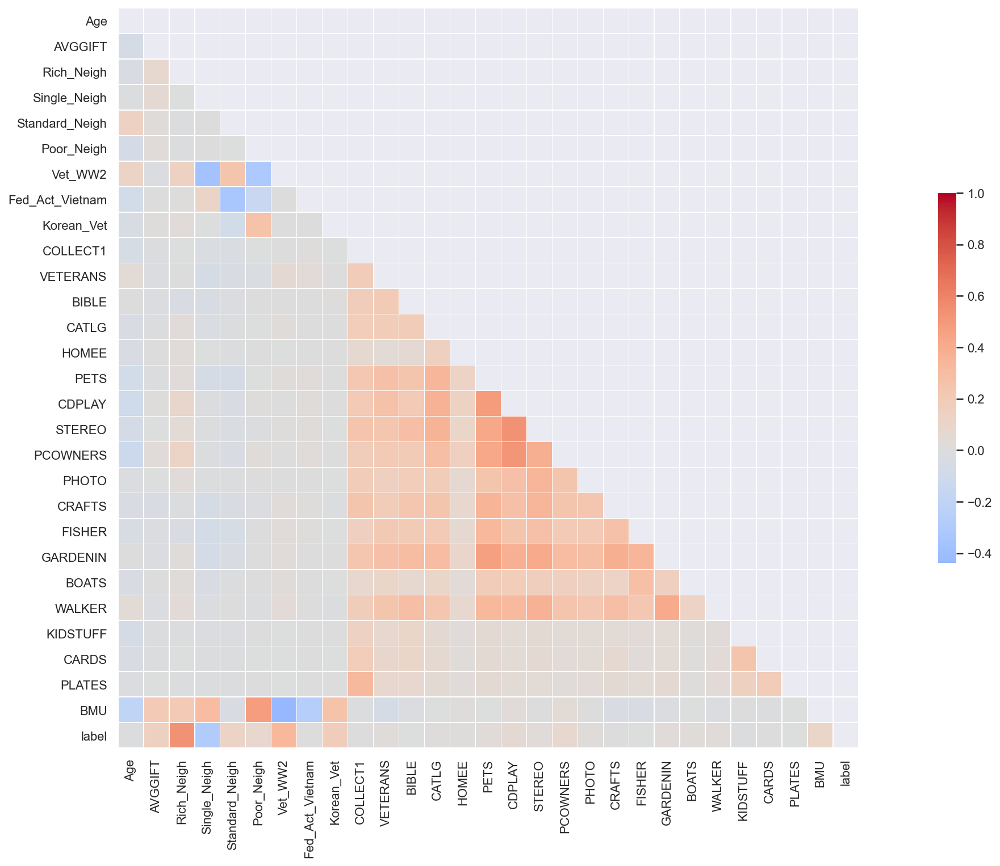

In [479]:
heatmap(data_not_LI,'pearson')

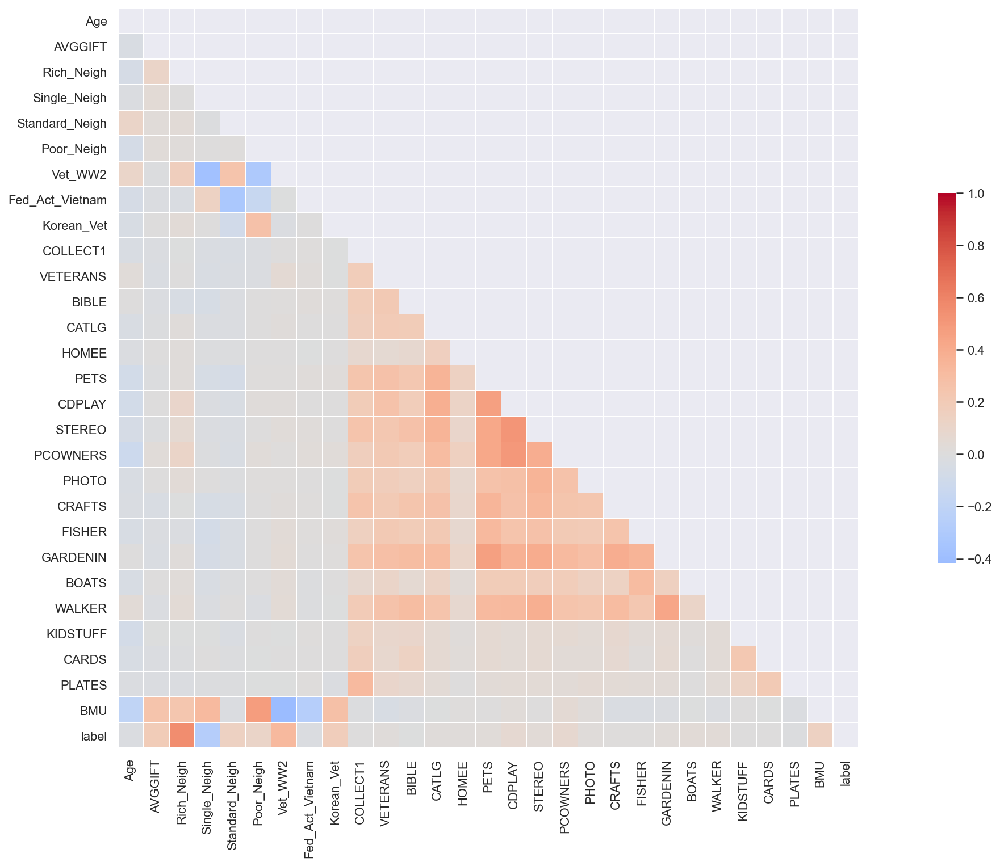

In [480]:
heatmap(data_AL,'pearson')

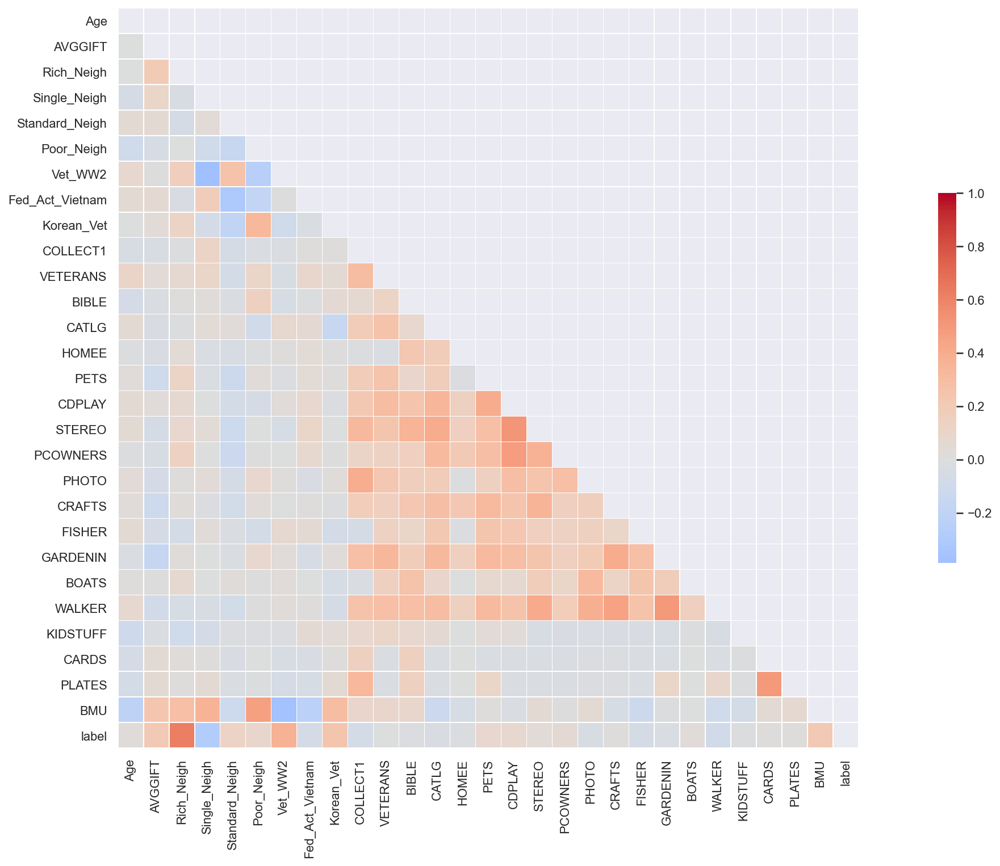

In [481]:
heatmap(data_SI,'pearson')

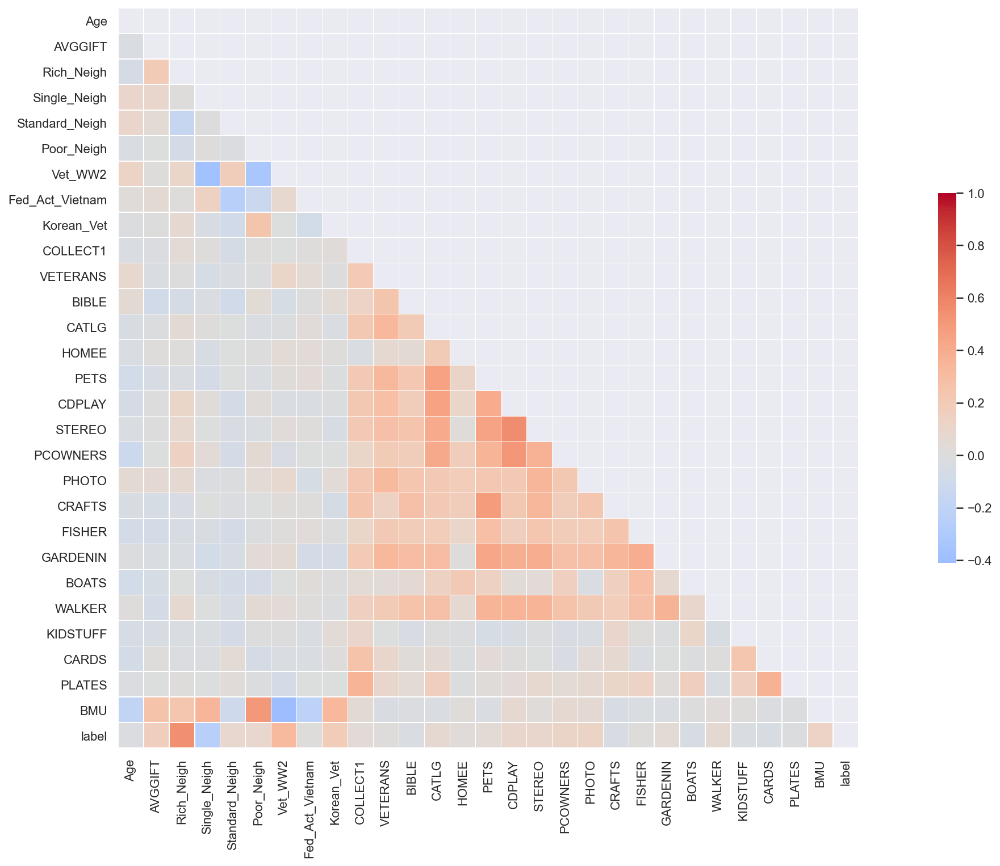

In [482]:
heatmap(data_SL,'pearson')

Checking the behaviour of donors from each label/cluster, previously defined

In [491]:
print('label 0: ',len(labeled_data[(labeled_data.label == 0)]))
print('----------------------------------')
print('label 1: ',len(labeled_data[(labeled_data.label == 1)]))
print('----------------------------------')
print('label 2: ',len(labeled_data[(labeled_data.label == 2)]))
print('----------------------------------')
print('label 3: ',len(labeled_data[(labeled_data.label == 3)]))

label 0:  29796
----------------------------------
label 1:  35507
----------------------------------
label 2:  8101
----------------------------------
label 3:  22008


- All labels/clusters have a reasonable amount of samples(observations)

In [492]:
labeled_data.drop(['BMU'], axis = 1, inplace = True)

### Exploration of the behaviour of  each label

#### Label 0

In [494]:
label_0 = labeled_data[(labeled_data.label == 0)]
label_0

,Age,AVGGIFT,Rich_Neigh,Single_Neigh,Standard_Neigh,Poor_Neigh,Vet_WW2,Fed_Act_Vietnam,Korean_Vet,COLLECT1,...,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,label
CONTROLN,,,,,,,,,,,,,,,,,,,,,
7112,0.818182,-0.672673,-1.963340,1.598166,0.203267,0.418260,0.570080,-0.551541,-0.653996,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0
60127,0.681818,0.121753,-0.407631,4.004087,0.571795,-0.849492,-0.824995,-1.738572,0.653456,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
64667,-0.727273,0.098257,0.316865,1.737776,-0.583687,-0.714019,-1.240325,0.378521,0.312528,0.0,...,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0
35557,0.090909,-0.498547,-0.498420,0.190102,-0.905373,-0.706793,-1.134175,-0.109691,-0.984999,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
92152,0.681818,-0.469267,0.722208,-0.667635,-0.422560,-0.409350,-1.091292,-0.720007,-0.020446,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56972,-0.818182,-0.547889,0.754451,-0.071372,-1.077789,-0.415644,-0.630120,0.679445,-0.882842,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
22658,-0.181818,-0.606630,-1.909409,0.388914,0.316565,0.961325,-0.884793,-0.857250,0.060004,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
131980,-0.181818,-0.331388,-0.199243,2.125573,-1.110911,-1.717315,-2.163818,2.590027,-0.682861,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


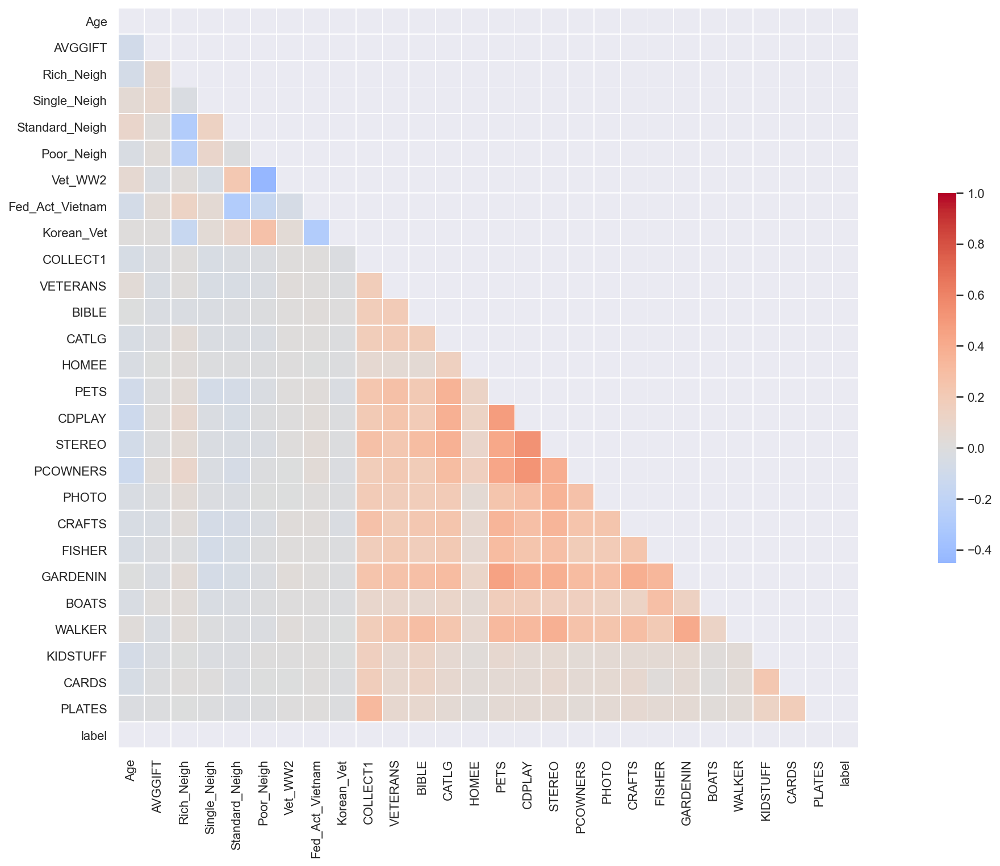

In [496]:
heatmap(label_0,'pearson')

## Profiling Report

In [503]:
from pandas_profiling import ProfileReport
profile = ProfileReport(
    labeled_data, 
    title='PVA Donors',
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": False},
        "kendall": {"calculate": False},
        "phi_k": {"calculate": False},
        "cramers": {"calculate": False},
    },
)

profile.to_notebook_iframe()